<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1TRNaCfYstvcIQqoUSdukYQGF6LuyL7Tv" width=600 height=320/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

# Домашнее задание. Автоэнкодеры


## Комментарии к решению
Если возникнут вопросы, мой телеграм @Lunaplus

Обученные модели можно открыть на google-диске. 
Часть обучения выполнялось в *.py скриптах, jupyter имеет ряд недостатоко, из-за которых иногда десятки выполненых эпох пропадают.

https://drive.google.com/drive/u/0/folders/1iKiZP9hupFAXOXbjCit2AYfREYxVBi5_

Задание оказалалось как обычно очень объемное, есть ряд моментов, над которыми можно было бы еще работать, но я и так забила на работу, чтобы все выполнить! 


# Часть 1. Vanilla Autoencoder (10 баллов)

## 1.1. Подготовка данных (0.5 балла)


In [10]:
import numpy as np
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
import matplotlib.pyplot as plt

import os
import pandas as pd
import skimage.io
from skimage.transform import resize


%matplotlib inline

In [22]:
def fetch_dataset(attrs_name="lfw_attributes.txt",
                  images_name="lfw-deepfunneled",
                  dx=80, dy=80,
                  dimx=64, dimy=64
                  ):
    # download if not exists
    if not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    # read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt", sep='\t', skiprows=1, )
    df_attrs = pd.DataFrame(df_attrs.iloc[:, :-1].values, columns=df_attrs.columns[1:])

    # read photos
    photo_ids = []
    i = 0
    for dirpath, dirnames, filenames in os.walk(images_name):
        for fname in filenames:
            if fname.endswith(".jpg"):
                i += 1
                fpath = os.path.join(dirpath, fname)
                photo_id = fname[:-4].replace('_', ' ').split()
                try:
                    person_id = ' '.join(photo_id[:-1])
                    photo_number = int(photo_id[-1])
                    photo_ids.append({'person': person_id, 'imagenum': photo_number, 'photo_path': fpath})
                except:
                    pass
                print(fpath, i)
    photo_ids = pd.DataFrame(photo_ids)
    # print(photo_ids)
    # mass-merge
    # (photos now have same order as attributes)
    df = pd.merge(df_attrs, photo_ids, on=('person', 'imagenum'))

    assert len(df) == len(df_attrs), "lost some data when merging dataframes"

    # print(df.shape)
    # image preprocessing
    all_photos = df['photo_path'].apply(skimage.io.imread) \
        .apply(lambda img: img[dy:-dy, dx:-dx]) \
        .apply(lambda img: resize(img, [dimx, dimy]))

    all_photos = np.stack(all_photos.values)  # .astype('uint8')
    all_attrs = df.drop(["photo_path", "person", "imagenum"], axis=1)

    return all_photos, all_attrs

In [4]:
# Каждый раз читать данные из католога слишком долго, поэтому их можно один раз сохранить 
# в файле с помощью сериализации модулем pickle
# Установите FETCH_DATASET = True если хотиле загрузить данные снова из католога
FETCH_DATASET = False
import pickle
if FETCH_DATASET:
    data, attrs = fetch_dataset()
    f = open("main_data.df", "wb")
    pickle.dump(data, f)
    f.close()
    f = open("main_attrs.df", "wb")
    pickle.dump(attrs, f)
    f.close()
else:
    f = open("main_data.df", "rb")
    data = pickle.load(f)
    f.close()
    f = open("main_attrs.df", "rb")
    attrs = pickle.load(f)
    f.close()

device = ("cuda:0" if torch.cuda.is_available() else "cpu")



Разбейте выборку картинок на train и val, выведите несколько картинок в output, чтобы посмотреть, как они выглядят, и приведите картинки к тензорам pytorch, чтобы можно было скормить их сети:

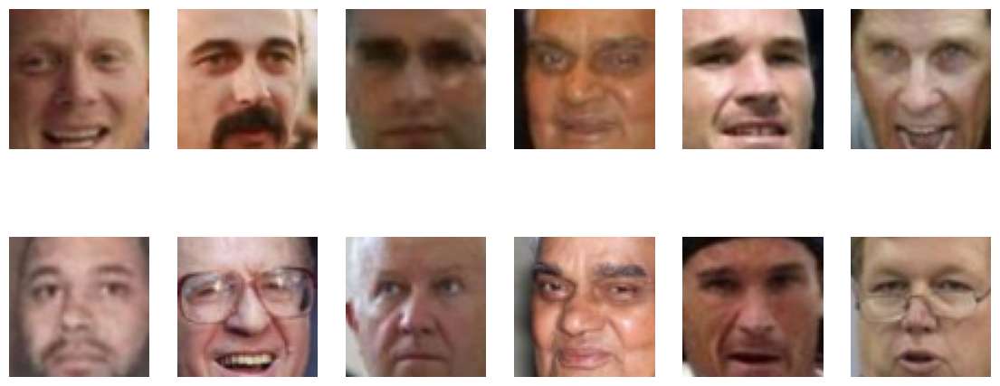

In [4]:
fig, ax = plt.subplots(2, 6, figsize=(14,6))
ind1 = [1,10,600,1000,1700,12100]
ind2 = [2,11,601,1001,1701,12101]
ims1 = data[ind1]
ims2 = data[ind2]
for i in range(6):
    ax[0][i].axis("off")
    
    #ax[0][i].title(attrs.iloc[ind1[i]])
    ax[0][i].imshow(ims1[i])
    ax[1][i].axis("off")
    ax[1][i].imshow(ims2[i])
plt.show()

In [5]:
print(data.shape)

(13143, 64, 64, 3)


In [5]:
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
batch_size = 16

X_train, X_val = train_test_split(np.array(data, np.float32), train_size=0.8, shuffle=True, random_state=100)
X_tr = DataLoader(X_train, batch_size=batch_size, drop_last = True)
X_vl = DataLoader(X_val, batch_size=batch_size)

## 1.2. Архитектура модели (1.5 балла)
В этом разделе мы напишем и обучем обычный автоэнкодер.



<img src="https://www.notion.so/image/https%3A%2F%2Fs3-us-west-2.amazonaws.com%2Fsecure.notion-static.com%2F4b8adf79-8e6a-4b7d-9061-8617a00edbb1%2F__2021-04-30__14.53.33.png?table=block&id=56f187b4-279f-4208-b1ed-4bda5f91bfc0&width=2880&userId=3b1b5e32-1cfb-4b0f-8705-5a524a8f56e3&cache=v2" alt="Autoencoder">


^ напомню, что автоэнкодер выглядит вот так

Реализуем autoencoder. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Экспериментируйте!

In [ ]:
from copy import deepcopy

In [6]:
latent_dim = 32
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super().__init__()
        input_dim_flat = input_dim[0]*input_dim[1]*input_dim[2]
        self.encoder = nn.Sequential(
            nn.Flatten(1),
            nn.Linear(input_dim_flat, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, latent_dim)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, input_dim_flat),
            nn.Unflatten(1, (input_dim[0], input_dim[1], input_dim[2]))
        )

    def forward(self, sample):
        latent = self.encoder(sample)
        reconstruct = self.decoder(latent)
        return reconstruct, latent



    def decode(self, latent):
        return self.decoder(latent)

In [8]:
loss_fn = F.mse_loss

model = Autoencoder((64,64,3), latent_dim)

optimizator = optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.05)


## 1.3 Обучение (2 балла)

Осталось написать код обучения автоэнкодера. При этом было бы неплохо в процессе иногда смотреть, как автоэнкодер реконструирует изображения на данном этапе обучения. Наример, после каждой эпохи (прогона train выборки через автоэекодер) можно смотреть, какие реконструкции получились для каких-то изображений val выборки.

А, ну еще было бы неплохо выводить графики train и val лоссов в процессе тренировки =)

In [79]:
def train(model, loss_fn, epochs, epoch_start, X_tr, X_vl,  scheduler):
    analysis_dict = {"loss_train": [], "loss_val": []}
    next_epoch_num = epoch_start
    for epoch in range(epochs):
        print('* Epoch %d/%d' % (next_epoch_num + 1, epoch_start + epochs))
        for x in X_tr:
            loss_step = 0
            model.train()
            optimizator.zero_grad()
            x_rec, x_lat = model(x)
            loss = loss_fn(x, x_rec)

            loss.backward()
            optimizator.step()
            if loss_step == 0:
                loss_step = loss
            else:
                loss_step = (loss_step + loss) / 2
        # print(x_rec[0][0][0], x[0][0][0])
        analysis_dict["loss_train"].append(loss_step.detach().numpy())
        print(f"on {epoch + epoch_start + 1} / {epochs + epoch_start} loss: {loss}")
        x_vl = iter(X_vl).next()
        x_vl_rec, x_vl_lat = model(x_vl)
        loss_val = loss_fn(x_vl, x_vl_rec)
        analysis_dict["loss_val"].append(loss_val.detach().numpy())


        fig, ax = plt.subplots(2, 6, figsize=(14, 6))
        for i in range(6):
            ax[0][i].imshow(x_vl[i].detach().numpy())
            ax[1][i].imshow(x_vl_rec[i].detach().numpy())
            ax[0][i].axis('off')
            ax[1][i].axis("off")


        fig.suptitle('%d / %d - loss: %f' % (next_epoch_num + 1, epoch_start + epochs, loss_val))
        fig.savefig(str(next_epoch_num+1)+".jpg")
        next_epoch_num += 1
        scheduler.step()

    return pd.DataFrame(analysis_dict)

* Epoch 1/15
on 1 / 15 loss: 0.01582343317568302


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


* Epoch 2/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 2 / 15 loss: 0.012942601926624775
* Epoch 3/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 3 / 15 loss: 0.0113063370808959
* Epoch 4/15
on 4 / 15 loss: 0.010779357515275478


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


* Epoch 5/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 5 / 15 loss: 0.010195628739893436
* Epoch 6/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 6 / 15 loss: 0.009757823310792446
* Epoch 7/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 7 / 15 loss: 0.009587486274540424
* Epoch 8/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 8 / 15 loss: 0.009395613335072994
* Epoch 9/15
on 9 / 15 loss: 0.0092028072103858


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


* Epoch 10/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 10 / 15 loss: 0.009020279161632061
* Epoch 11/15
on 11 / 15 loss: 0.008854574523866177


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


* Epoch 12/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 12 / 15 loss: 0.008707930333912373
* Epoch 13/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 13 / 15 loss: 0.008573552593588829
* Epoch 14/15
on 14 / 15 loss: 0.008430655114352703


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


* Epoch 15/15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


on 15 / 15 loss: 0.008276334032416344


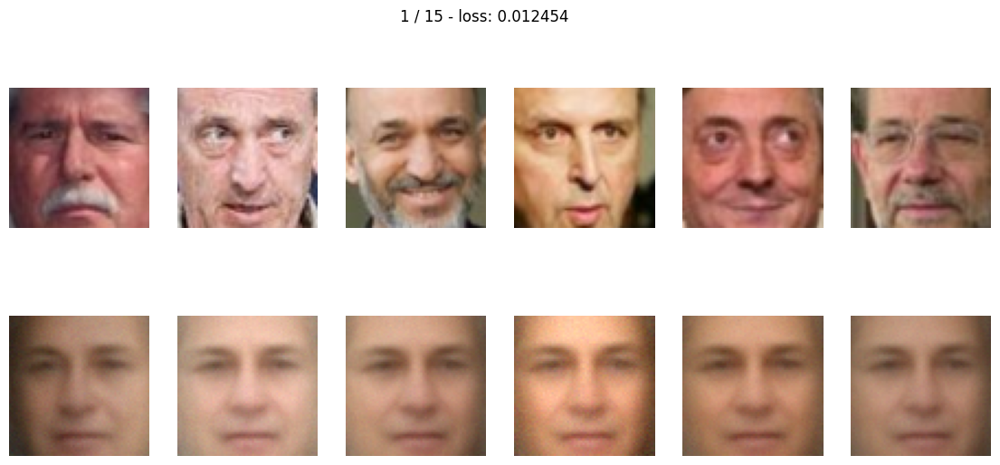

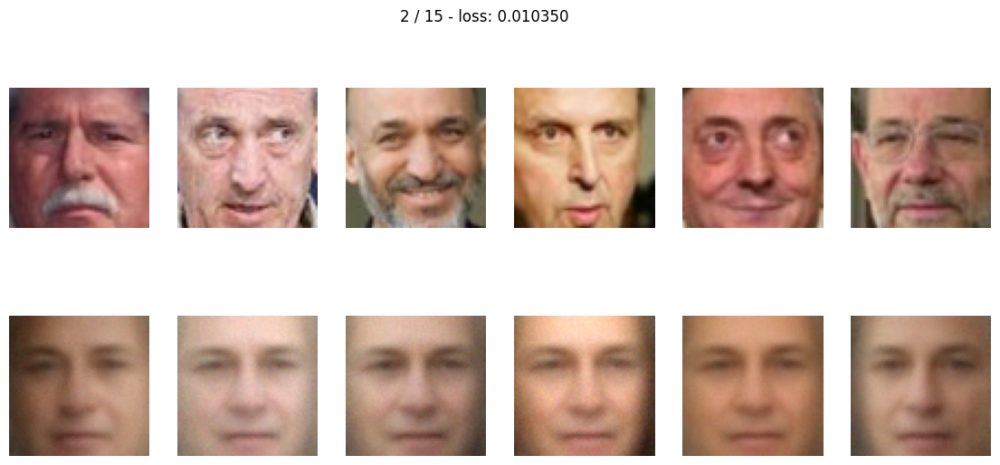

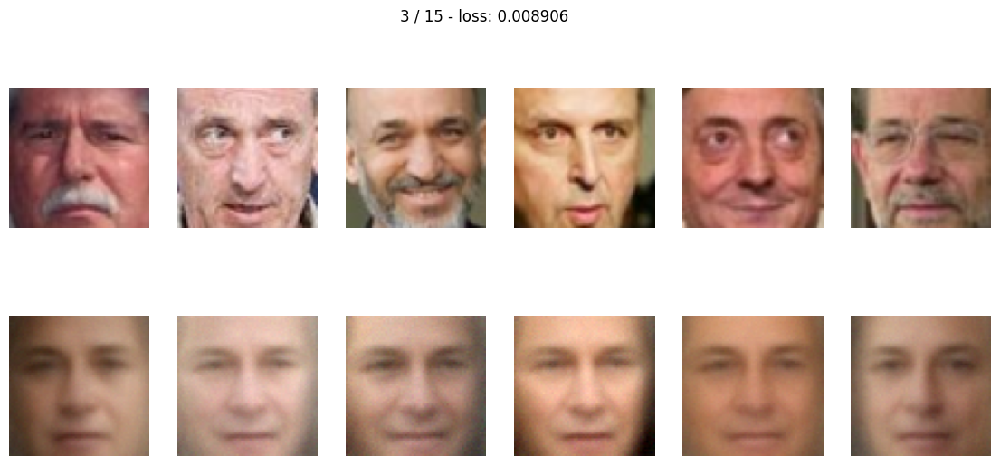

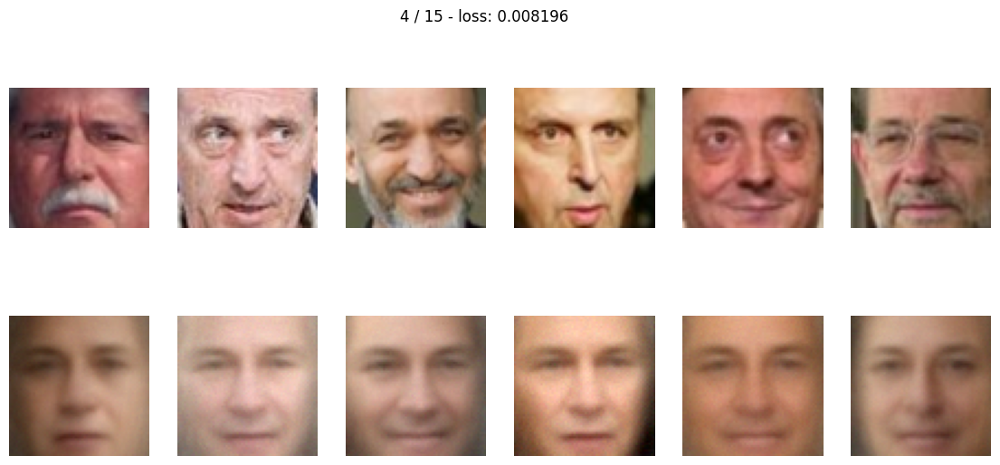

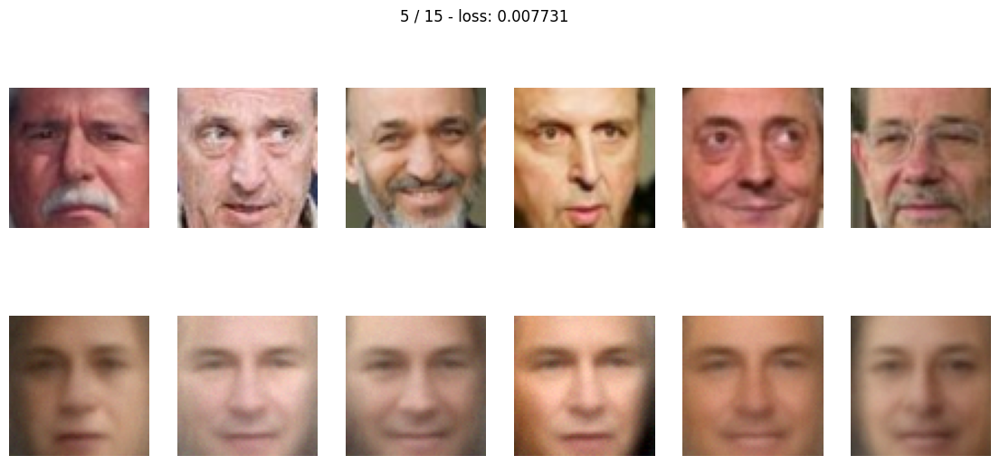

...

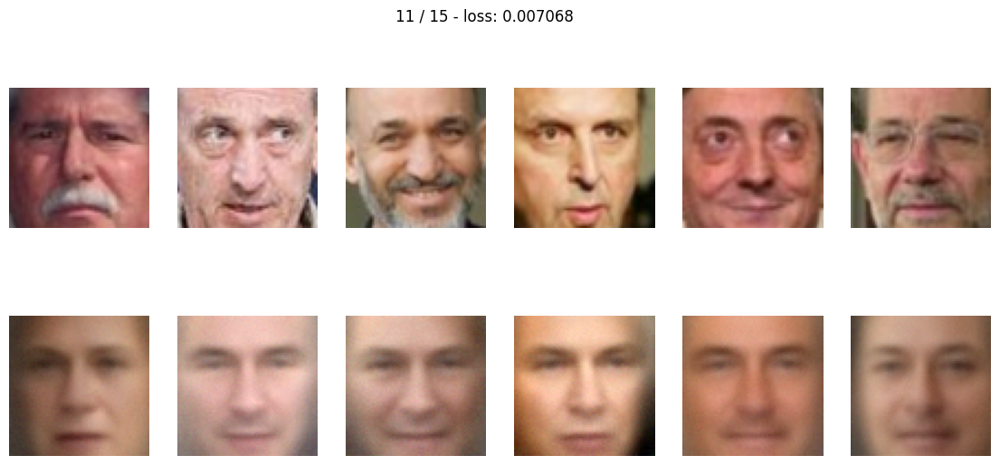

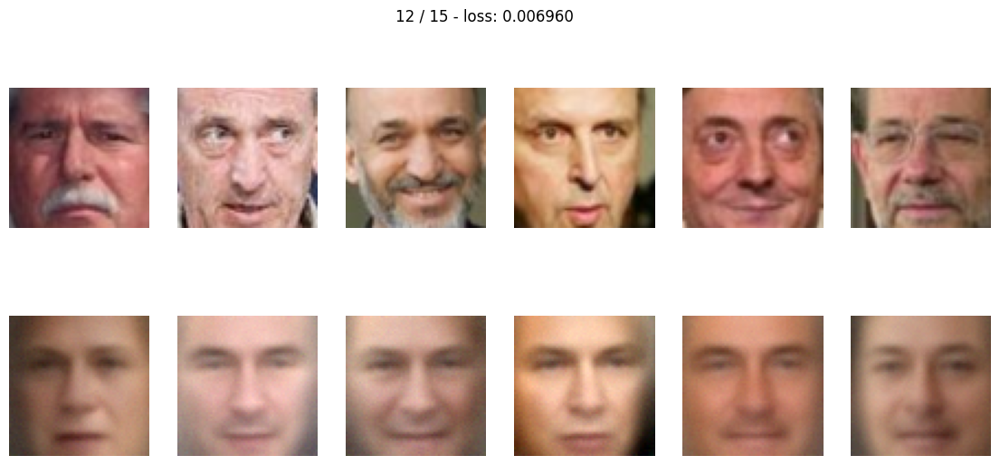

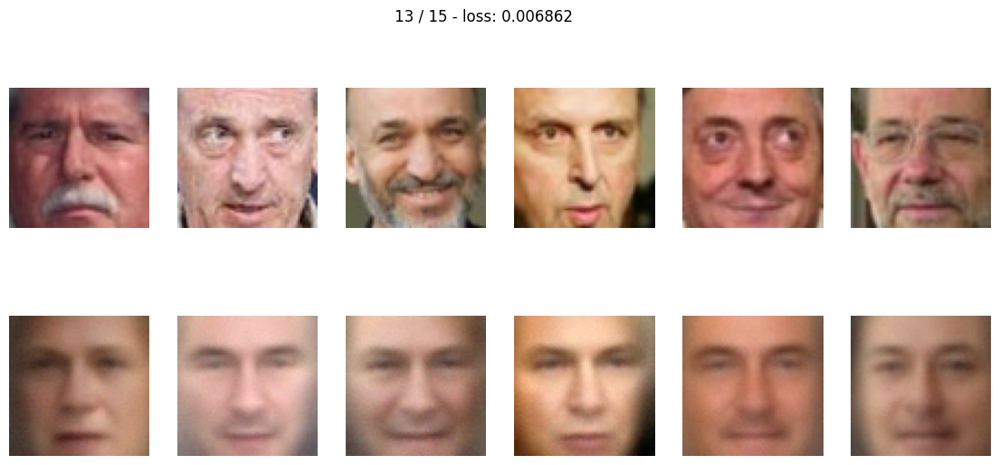

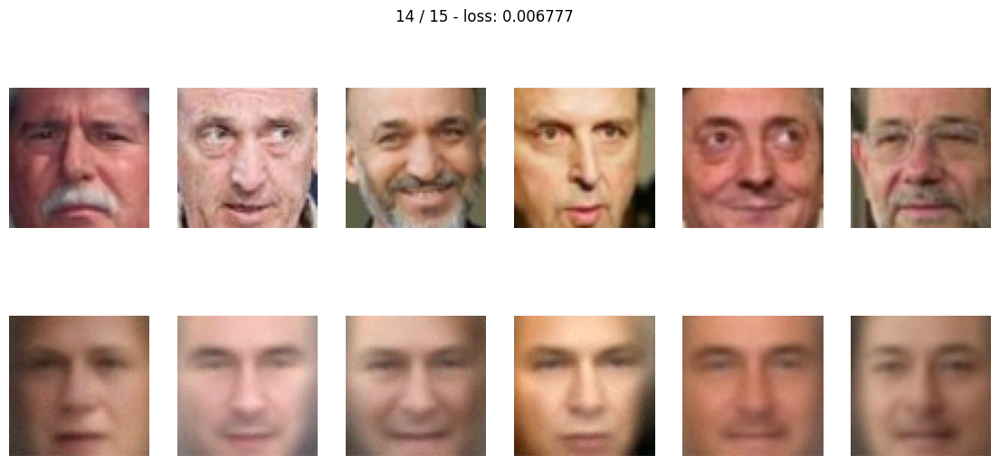

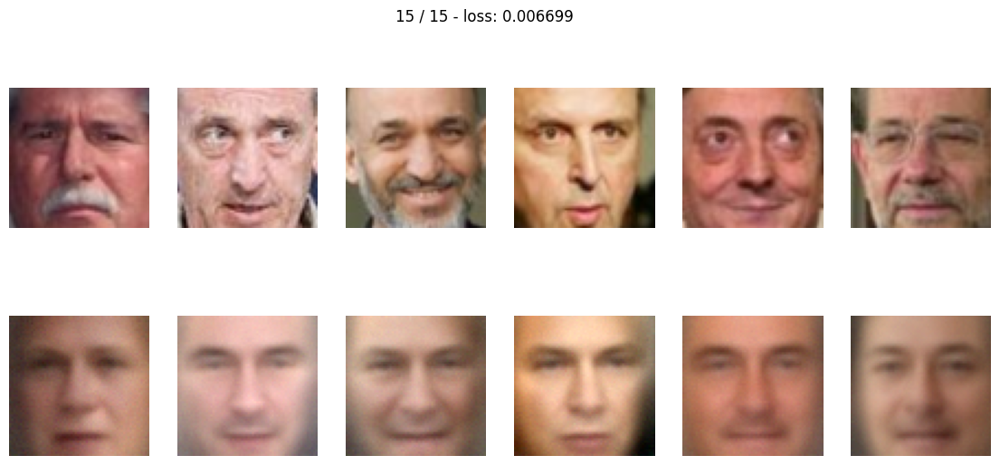

In [7]:
encoder = Autoencoder((64, 64, 3), latent_dim=32).to(device=device)
#1 - Установить FIRST = TRUE -если сеть только начинает обучатся
FIRST = True
net_name = "ae"

if FIRST:
    epoch_start = 0
    if not os.path.exists(net_name + "_epochs"):
        os.mkdir(net_name + "_epochs")

else:
    f = open(net_name+"_epoch.num", "rb")
    epoch_start = pickle.load(f)
    f.close()
    encoder.load_state_dict(torch.load(net_name + ".net"))

optimizator = optim.AdamW(encoder.parameters(), lr=0.0001, weight_decay=0.05)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizator, milestones=[5], gamma=0.2)
loss_fn = F.mse_loss

train_losses = []
test_loses = []
epochs = 15
batch_size = 16

X_train, X_val = train_test_split(np.array(data, np.float32), train_size=0.8, shuffle=True, random_state=100)
X_tr = DataLoader(X_train, batch_size=batch_size)
X_vl = DataLoader(X_val, batch_size=batch_size)
work_path = os.getcwd()
os.chdir(net_name+"_epochs")
analysis_data = train(encoder, loss_fn, epochs, epoch_start, X_tr, X_vl, scheduler)
os.chdir(work_path)
torch.save(encoder.state_dict(), net_name + ".net")


f = open(net_name+"_epoch.num", "wb")
epoch_next = epoch_start + epochs
pickle.dump(epoch_next, f)
f.close()


if FIRST:
    analysis_data.to_csv(net_name + ".csv")
else:
    analysis_data.to_csv(net_name+".csv", mode="a", header=False)


### В данном блокноте показан кусок обучения, 15 эпох. Но этого недостаточно, поэтому загрузим мою модель, которая была обучена на другом более мощном компьютере до значения функции ошибки 0.003 - файл модели ae32d.net
Файл можно скачать по ссылке [на google-диске](https://drive.google.com/drive/folders/1iKiZP9hupFAXOXbjCit2AYfREYxVBi5_?usp=sharing)


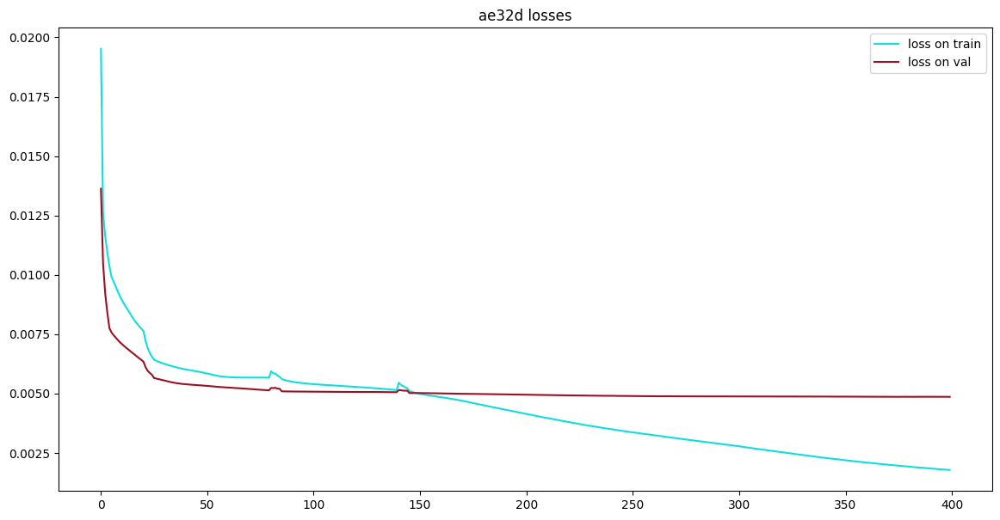

In [14]:
import pandas as pd
import matplotlib.pyplot as plt 
def plot_compare_losses(model_name, df):
    
    fig, ax = plt.subplots(1,1, figsize=(14,7))
    ax.set_title(model_name + " losses")
    ax.plot(df["loss_train"][:400], label ="loss on train", c="#12DDDD")
    
    ax.plot(df["loss_val"][:400], label = "loss on val", c="#991122")
    ax.legend()

    
    plt.show()

plot_compare_losses("ae32d", pd.read_csv("ae32d.csv"))
# В файле ae32d.csv были сохранены значения ошибки на обучении и на валидации (по 16 первым картинкам валидационной выборки). 
# как можно видеть на графике, приблизительно после 150 эпохи модель начала переобучатся. На трейне достигнуто значение функции ошибки 
# 0.001, но вот на валидационной выборке значение осталось около 0.005
# Скачки в районе 80 и 140 эпох связаны с тем, что в процессе обучения менялся lr.

Давайте посмотрим, как наш тренированный автоэекодер кодирует и восстанавливает картинки:

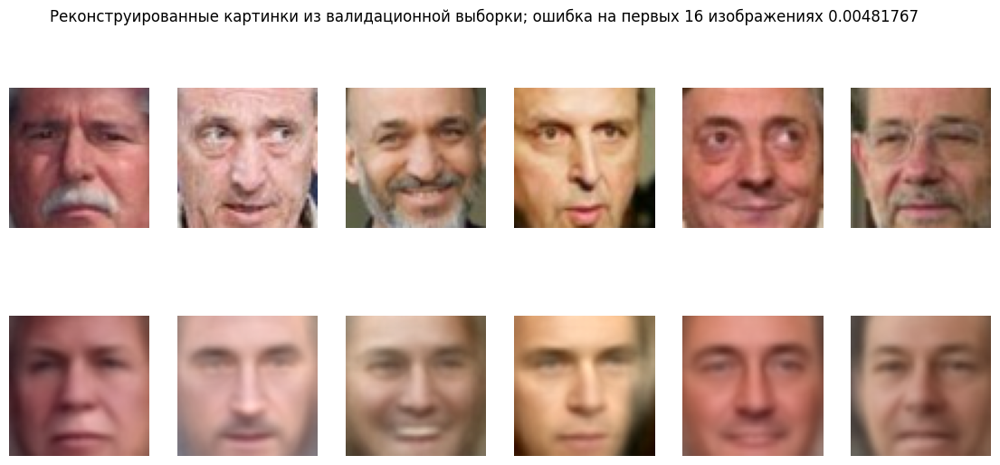

In [11]:
model = Autoencoder((64, 64, 3), latent_dim=32).to(device=device)
model.load_state_dict(torch.load("ae32d.net"))
x_vl = iter(X_vl).next()
x_vl_rec, x_vl_latent = model(x_vl)
x_tr = iter(X_tr).next()
x_tr_rec, x_tr_latent = model(x_tr)
fig, ax = plt.subplots(2, 6, figsize=(14, 6))
for i in range(6):
    #ax[0][i].imshow(x_vl[i].detach().numpy())
    #ax[1][i].imshow(x_vl_rec[i].detach().numpy())
    ax[0][i].imshow(torch.clip(x_vl[i],0,1).detach().numpy())
    ax[1][i].imshow(torch.clip(x_vl_rec[i], 0, 1).detach().numpy())
    ax[0][i].axis('off')
    ax[1][i].axis("off")


fig.suptitle("Реконструированные картинки из валидационной выборки; ошибка на первых 16 изображениях " + str(loss_fn(x_vl, x_vl_rec).detach().numpy()))
fig.savefig("tmp.jpg")


Not bad, right? 

## 1.4. Sampling (2 балла)

Давайте теперь будем не просто брать картинку, прогонять ее через автоэекодер и получать реконструкцию, а попробуем создать что-то НОВОЕ

Давайте возьмем и подсунем декодеру какие-нибудь сгенерированные нами векторы (например, из нормального распределения) и посмотрим на результат реконструкции декодера:

__Подсказка:__Е сли вместо лиц у вас выводится непонятно что, попробуйте посмотреть, как выглядят латентные векторы картинок из датасета. Так как в обучении нейронных сетей есть определенная доля рандома, векторы латентного слоя могут быть распределены НЕ как `np.random.randn(25, <latent_space_dim>)`. А чтобы у нас получались лица при запихивании вектора декодеру, вектор должен быть распределен так же, как латентные векторы реальных фоток. Так что в таком случае придется рандом немного подогнать.

In [25]:
latents = np.zeros((len(X_tr)*batch_size, latent_dim))
i=0
for x in X_tr:
    x_rec, x_lat = model(x)
    latents[i*batch_size:(i+1)*batch_size] = x_lat.detach().numpy()
    i += 1


means = latents.mean(axis=0)
std = latents.std(axis=0)
var = latents.var(axis=0)


covs = np.zeros((latent_dim, latent_dim))
for i in range(latent_dim):
    covs[i][i]=var[i]


## Генерировать латентный вектор будем из распределния с таким же матожиданием и дисперсией как у латентного представления построенной модели

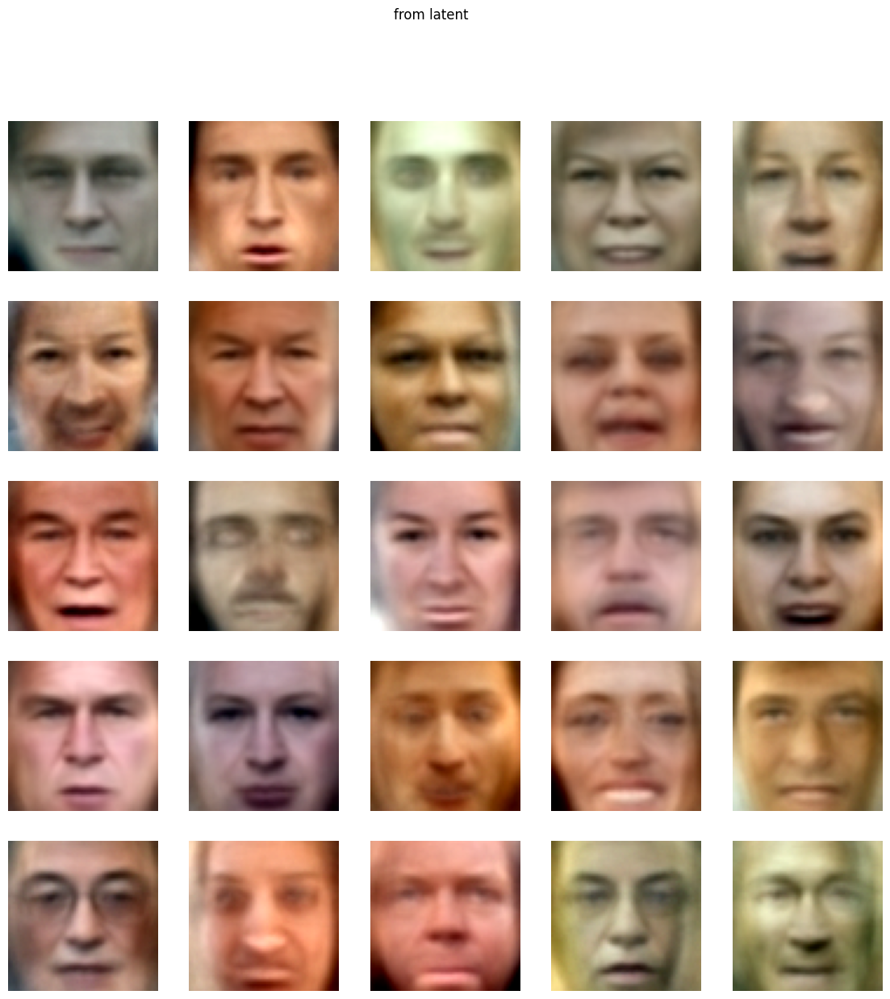

In [16]:
# сгенерируем 25 рандомных векторов размера latent_space
#z = np.random.randn(25, latent_dim)

z = np.random.multivariate_normal( means, covs, latent_dim)
output = model.decode(torch.FloatTensor(z))
fig, ax = plt.subplots(5, 5, figsize=(14, 14))
for i in range(5):
    for j in range(5):
    #ax[0][i].imshow(x_vl[i].detach().numpy())
    #ax[1][i].imshow(x_vl_rec[i].detach().numpy())
        ax[j][i].imshow(torch.clip(output[i+5*j],0,1).detach().numpy())
        ax[j][i].axis('off')
        

fig.suptitle("from latent")
fig.savefig("tmp1.jpg")


### Получились изоражения очень похожие на лица, но с большим количеством артефактов

## 1.5 Time to make fun! (4 балла)

Давайте научимся пририсовывать людям улыбки =)

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear" width="700" height="400">

План такой:

1. Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15) людей с улыбками и столько же без.

Найти людей с улыбками вам поможет файл с описанием датасета, скачанный вместе с датасетом. В нем указаны имена картинок и присутствубщие атрибуты (улыбки, очки...)

2. Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких

3. Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей

4. А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного человека и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

### Пририсуем ублыку лицам, которые не сильно замылены - атрибут Blurry
Правда улыка беззубая, но рот все равно у всех открылся. К сожалению исходные лица также немного изменились. 

Но в заданный отрезок времени достичь лучшего результата не удалось. 


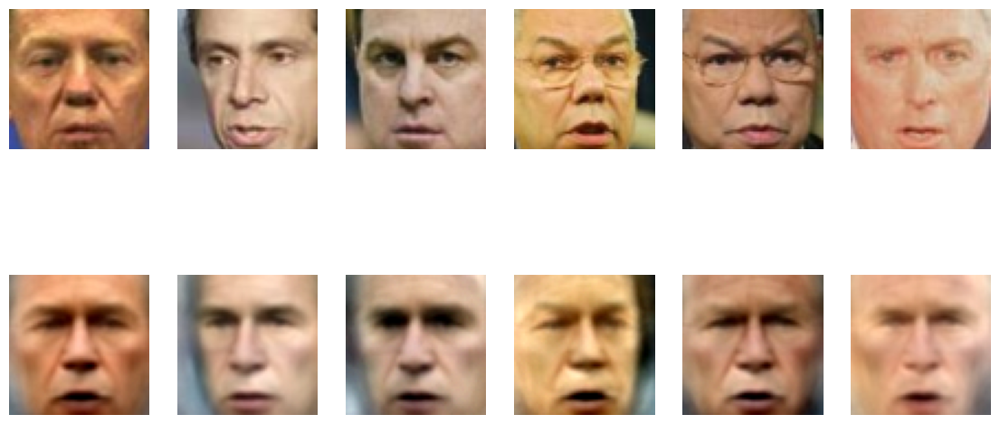

In [28]:
model.load_state_dict(torch.load("ae32d.net"))
#smile = data[attrs.Smiling > 1][0:15]
#no_smile = data[attrs.Smiling < -1][0:15]
data_not_blury=data[attrs.Blurry<-1.5]
attrs_not_blury = attrs[attrs.Blurry<-1.5]

smile = data_not_blury[attrs_not_blury.Smiling > 1.8][0:30]
no_smile = data_not_blury[attrs_not_blury.Smiling < -1.8][0:30]

latents_smile = np.zeros((len(smile), latent_dim))
latents_no_smile = np.zeros((len(no_smile), latent_dim))
i = 0
for i in range(len(smile)):
    x_rec, x_lat = model(torch.FloatTensor(smile[i]).view(1, -1))
    latents_smile[i] = x_lat[0].detach().numpy()
    i += 1
i = 0
for i in range(len(no_smile)):
    x_rec, x_lat = model(torch.FloatTensor(no_smile[i]).view(1, -1))
    latents_no_smile[i] = x_lat[0].detach().numpy()
    i += 1
smile_means = latents_smile.mean(axis=0)
no_smile_means = latents_no_smile.mean(axis=0)
smile_vector = smile_means - no_smile_means

fig, ax = plt.subplots(2, 6, figsize=(14,7))
x_rec, x_lat = model(torch.FloatTensor(no_smile[0:12]))
x_lat_smile = x_lat.sub(torch.FloatTensor(smile_vector))
x_rec = model.decode(x_lat_smile)
for i in range(6):
    #ax[0][i].imshow(torch.clip(x_rec[i], 0, 1).detach().numpy())
    #ax[1][i].imshow(torch.clip(x_rec[6+i], 0, 1).detach().numpy())
    ax[0][i].imshow(no_smile[i])
    ax[1][i].imshow(torch.clip(x_rec[i], 0, 1).detach().numpy())
    ax[0][i].axis("off")
    ax[1][i].axis("off")
plt.show()


### И для развлеченеия немного кучерявых

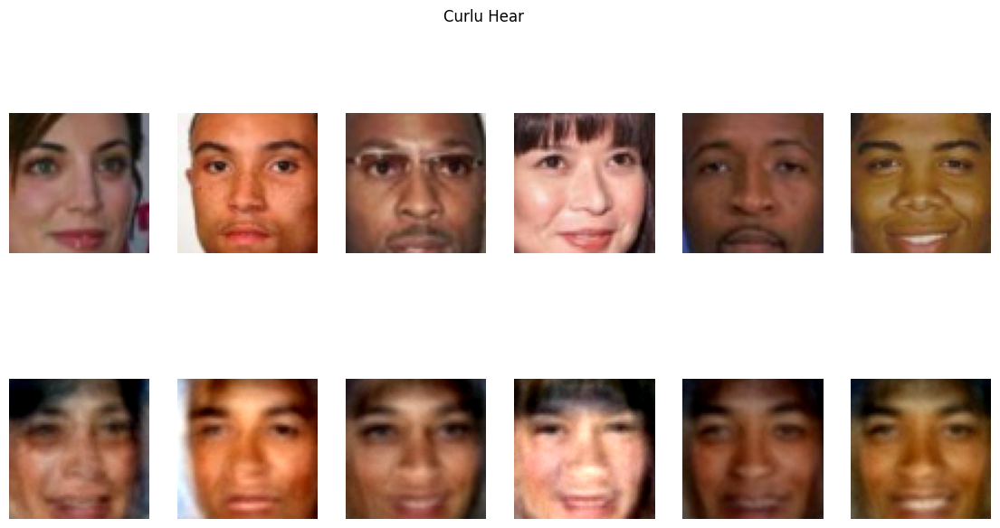

In [29]:
model.load_state_dict(torch.load("ae32d.net"))
#smile = data[attrs.Smiling > 1][0:15]
#no_smile = data[attrs.Smiling < -1][0:15]

smile = data[attrs["Curly Hair"] > 1.8][0:30]
no_smile = data[attrs["Curly Hair"]< -1.8][0:30]

latents_smile = np.zeros((len(smile), latent_dim))
latents_no_smile = np.zeros((len(no_smile), latent_dim))
i = 0
for i in range(len(smile)):
    x_rec, x_lat = model(torch.FloatTensor(smile[i]).view(1, -1))
    latents_smile[i] = x_lat[0].detach().numpy()
    i += 1
i = 0
for i in range(len(no_smile)):
    x_rec, x_lat = model(torch.FloatTensor(no_smile[i]).view(1, -1))
    latents_no_smile[i] = x_lat[0].detach().numpy()
    i += 1
smile_means = latents_smile.mean(axis=0)
no_smile_means = latents_no_smile.mean(axis=0)
smile_vector = smile_means - no_smile_means

fig, ax = plt.subplots(2, 6, figsize=(14,7))
x_rec, x_lat = model(torch.FloatTensor(no_smile[0:12]))
x_lat_smile = x_lat.sub(torch.FloatTensor(smile_vector))
x_rec = model.decode(x_lat_smile)
for i in range(6):
    #ax[0][i].imshow(torch.clip(x_rec[i], 0, 1).detach().numpy())
    #ax[1][i].imshow(torch.clip(x_rec[6+i], 0, 1).detach().numpy())
    ax[0][i].imshow(no_smile[i])
    ax[1][i].imshow(torch.clip(x_rec[i], 0, 1).detach().numpy())
    ax[0][i].axis("off")
    ax[1][i].axis("off")
fig.suptitle("Curlu Hear")
plt.show()


Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... в общем, все, на что хватит фантазии и на что есть атрибуты в `all_attrs`:)

# Часть 2: Variational Autoencoder (10 баллов) 

Займемся обучением вариационных автоэнкодеров — проапгрейженной версии AE. Обучать будем на датасете MNIST, содержащем написанные от руки цифры от 0 до 9

In [13]:
batch_size = 32

from torchvision import datasets, transforms
# MNIST Dataset
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

## 2.1 Архитектура модели и обучение (2 балла)

Реализуем VAE. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Рекомендуем пользоваться более сложными моделями, чем та, что была на семинаре:) Экспериментируйте!

In [ ]:
class VAE(nn.Module):
    def __init__(self):
        <определите архитектуры encoder и decoder
        помните, у encoder должны быть два "хвоста", 
        т.е. encoder должен кодировать картинку в 2 переменные -- mu и logsigma>

    def encode(self, x):
        <реализуйте forward проход энкодера
        в качестве ваозвращаемых переменных -- mu и logsigma>
        
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            <засемплируйте латентный вектор из нормального распределения с параметрами mu и sigma>
        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu. 
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu
    
    def decode(self, z):
        <реализуйте forward проход декодера
        в качестве возвращаемой переменной -- reconstruction>
        
        return reconstruction

    def forward(self, x):
        <используя encode и decode, реализуйте forward проход автоэнкодера
        в качестве ваозвращаемых переменных -- mu, logsigma и reconstruction>
        return mu, logsigma, reconstruction

In [4]:
from torch import nn
import torch.nn.functional as F
import torch
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super().__init__()
        self.input_dim = input_dim
        self.fc1 = nn.Linear(input_dim, 500)
        self.fc21 = nn.Linear(500, latent_dim)  # fc21 for mean of Z
        self.fc22 = nn.Linear(500, latent_dim)  # fc22 for log variance of Z
        self.fc3 = nn.Linear(latent_dim, 500)
        self.fc4 = nn.Linear(500, input_dim)

    def encode(self, x):
        x1 = F.relu(self.fc1(x))
        mu = self.fc21(x1)
        logsigma = self.fc22(x1)
        return mu, logsigma

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.rand_like(std)
            return mu + eps * std
        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu.
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu

    def decode(self, z):
        x = F.relu(self.fc3(z))
        return torch.sigmoid(self.fc4(x))

    def forward(self, x):
        # x: [batch size, 1, 28,28] -> x: [batch size, 784]

        x = x.view(-1, self.input_dim)
        mu, logsigma = self.encode(x)
        z = self.gaussian_sampler(mu, logsigma)
        return self.decode(z), mu, logsigma

Определим лосс и его компоненты для VAE:

Надеюсь, вы уже прочитали материал в towardsdatascience (или еще где-то) про VAE и знаете, что лосс у VAE состоит из двух частей: KL и log-likelihood.

Общий лосс будет выглядеть так:

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Формула для KL-дивергенции:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$

В качестве log-likelihood возьмем привычную нам кросс-энтропию.

In [8]:
def KL_divergence(mu, logsigma):
    """
    часть функции потерь, которая отвечает за "близость" латентных представлений разных людей
    """
    loss = 0.5 * torch.sum(mu.pow(2) + logsigma.exp() - logsigma - 1)
    return loss

def log_likelihood(x, reconstruction):
    """
    часть функции потерь, которая отвечает за качество реконструкции (как mse в обычном autoencoder)
    """
    loss = F.binary_cross_entropy(reconstruction, x.view(-1, 784), reduction='sum')
    return loss

def loss_vae(reconstruction, x, mu, logsigma):
    BCE = log_likelihood(x, reconstruction)
    KLD = KL_divergence(mu, logsigma)
    return BCE + KLD


И обучим модель:

In [11]:
net_name ="vae"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

epochs = 10
latent_dim = 32
lr = 1e-4
model = VAE(784, latent_dim).to(device)

criterion = loss_vae

optimizator = optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizator, milestones=[15], gamma=0.2)

In [81]:
def train(model, loss_fn, epochs, epoch_start, train_loader, test_loader, scheduler):
    analysis_dict = {"loss_train": [], "loss_val": []}
    next_epoch_num = epoch_start
    for epoch in range(epochs):
        print('* Epoch %d/%d' % (next_epoch_num + 1, epoch_start + epochs))
        for x, _ in train_loader:
            loss_step = 0
            model.train()
            optimizator.zero_grad()
            x_rec, mu, logsigma = model(x.to(device))
            loss = loss_fn(x_rec, x, mu, logsigma)
            loss.backward()
            optimizator.step()
            if loss_step == 0:
                loss_step = loss
            else:
                loss_step = (loss_step + loss) / 2
        analysis_dict["loss_train"].append(loss_step.detach().numpy())
        print(f"on {epoch + epoch_start + 1} / {epochs + epoch_start} loss: {loss}")
        x_vl, _ = iter(test_loader).next()
        x_vl_rec, x_vl_mu, x_vl_logsigma = model(x_vl)
        loss_val = loss_fn(x_vl_rec, x_vl, x_vl_mu, x_vl_logsigma)
        analysis_dict["loss_val"].append(loss_val.detach().numpy())

        fig, ax = plt.subplots(2, 6, figsize=(14, 6))
        for i in range(6):
            ax[0][i].imshow(torch.permute(x_vl[i],(1,2,0)).detach().numpy())
            ax[1][i].imshow(torch.permute(x_vl_rec[i].view(1,28,28),(1,2,0)).detach().numpy())
            ax[0][i].axis('off')
            ax[1][i].axis("off")

        fig.suptitle('%d / %d - loss: %f' % (next_epoch_num + 1, epoch_start + epochs, loss_val))
        fig.savefig(str(next_epoch_num + 1) + ".jpg")
        next_epoch_num += 1
        scheduler.step()

    return pd.DataFrame(analysis_dict)

* Epoch 1/10
on 1 / 10 loss: 5636.70458984375
* Epoch 2/10
on 2 / 10 loss: 5201.15673828125
* Epoch 3/10
on 3 / 10 loss: 5258.68798828125
* Epoch 4/10
on 4 / 10 loss: 4731.05029296875
* Epoch 5/10
on 5 / 10 loss: 5656.029296875
* Epoch 6/10
on 6 / 10 loss: 4810.98779296875
* Epoch 7/10
on 7 / 10 loss: 4996.58056640625
* Epoch 8/10
on 8 / 10 loss: 5064.53759765625
* Epoch 9/10
on 9 / 10 loss: 4877.60986328125
* Epoch 10/10
on 10 / 10 loss: 5367.6298828125


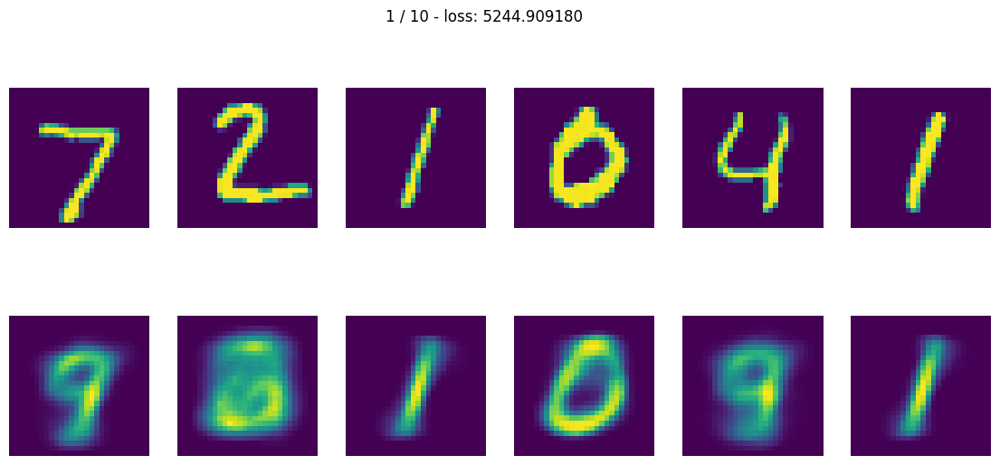

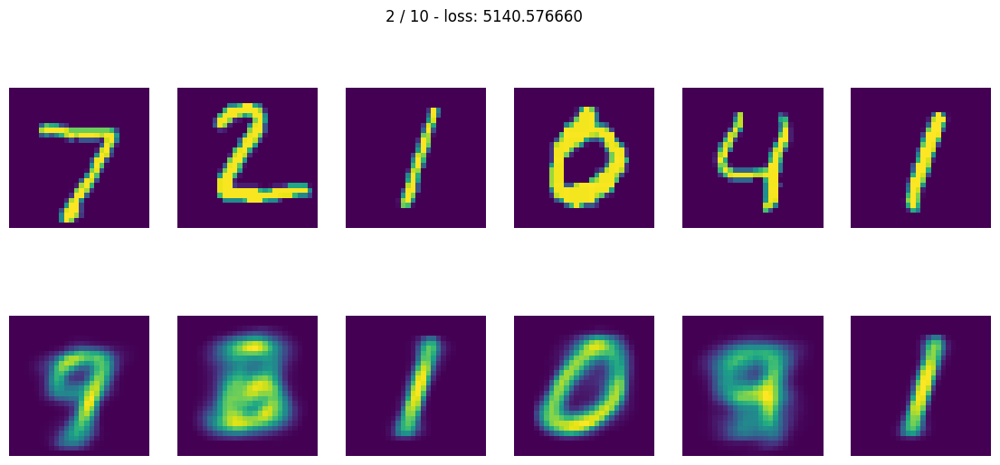

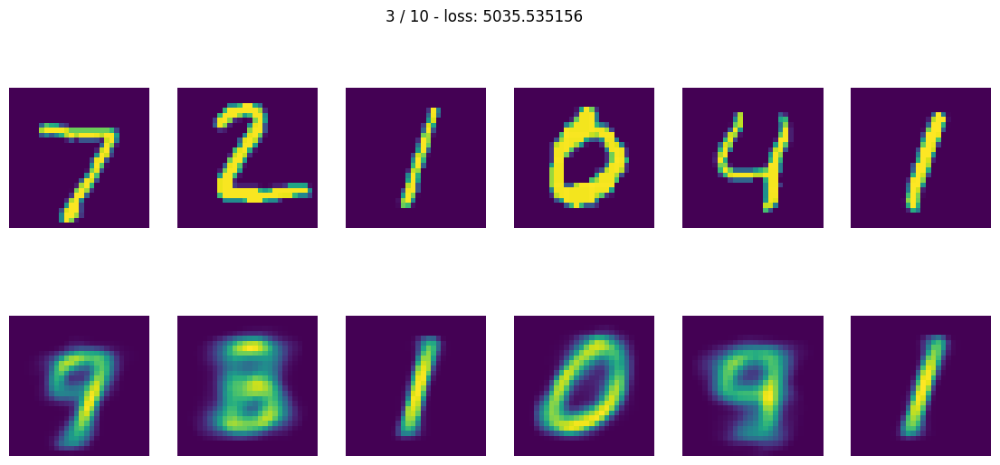

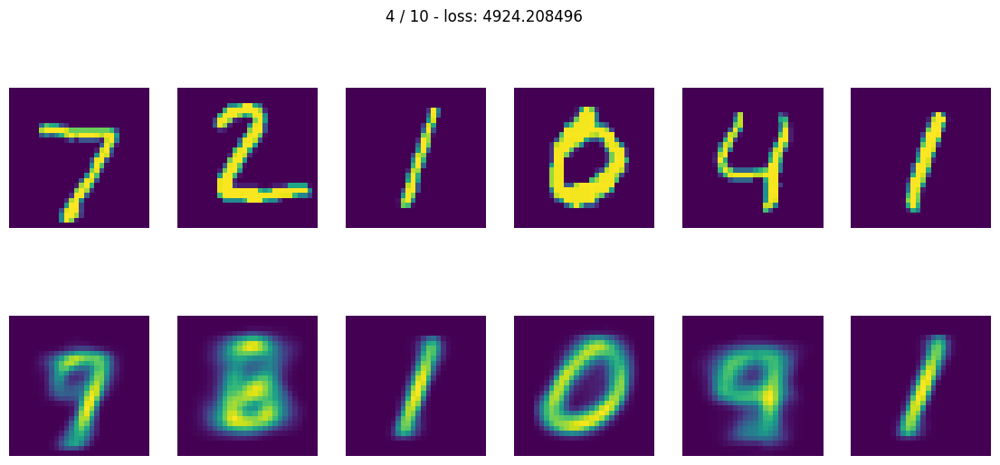

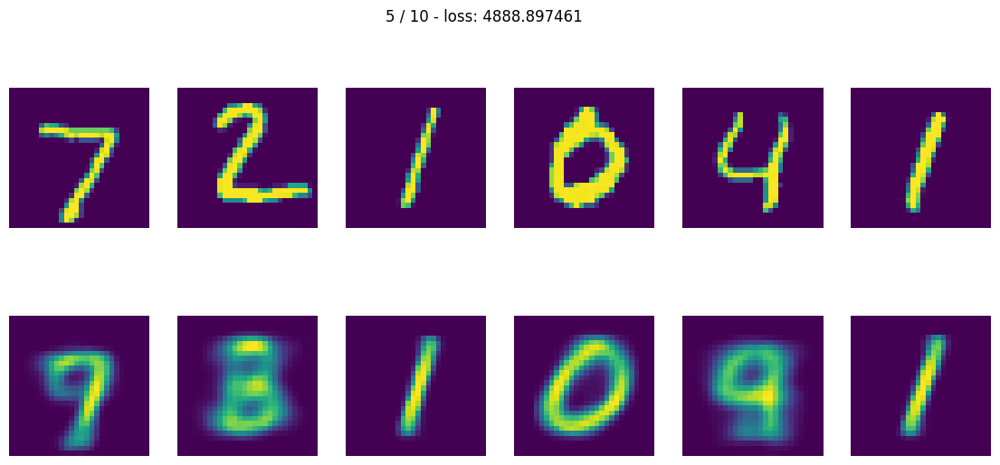

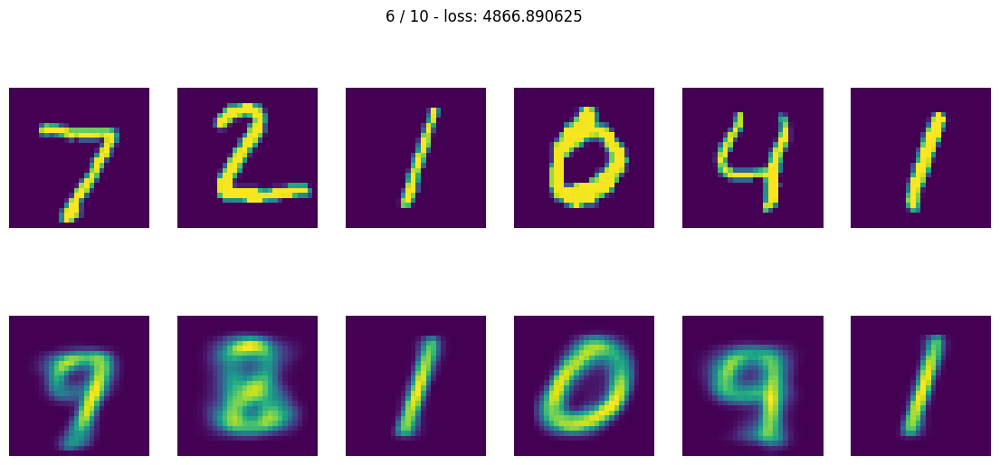

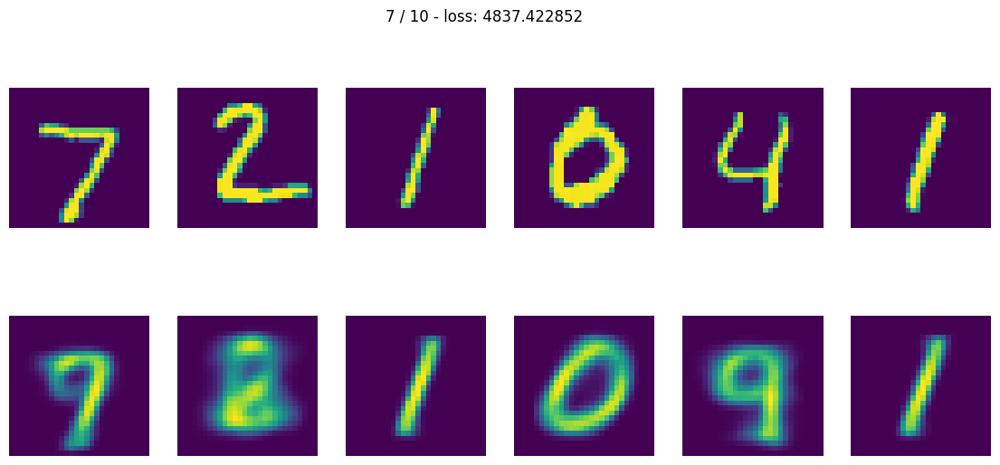

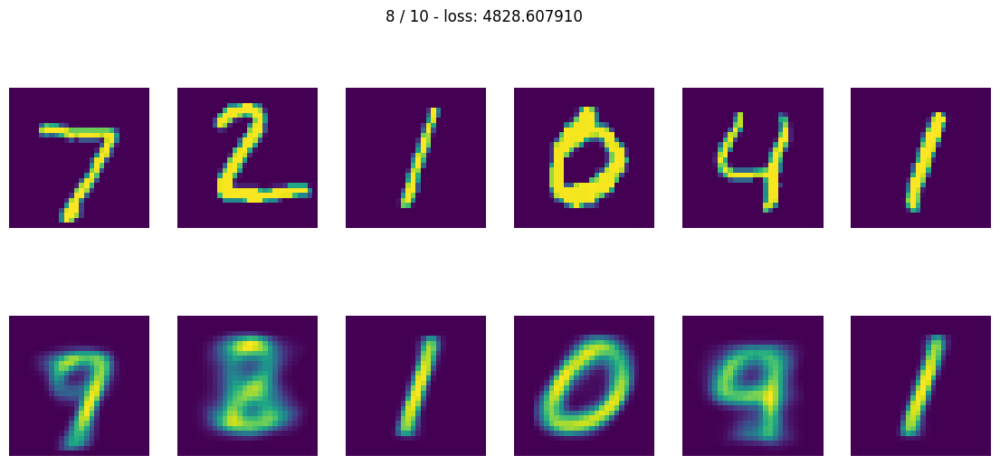

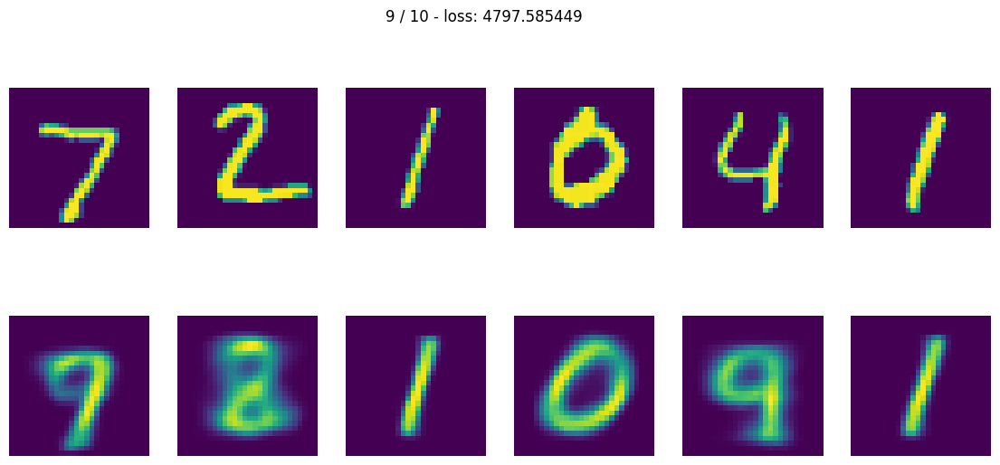

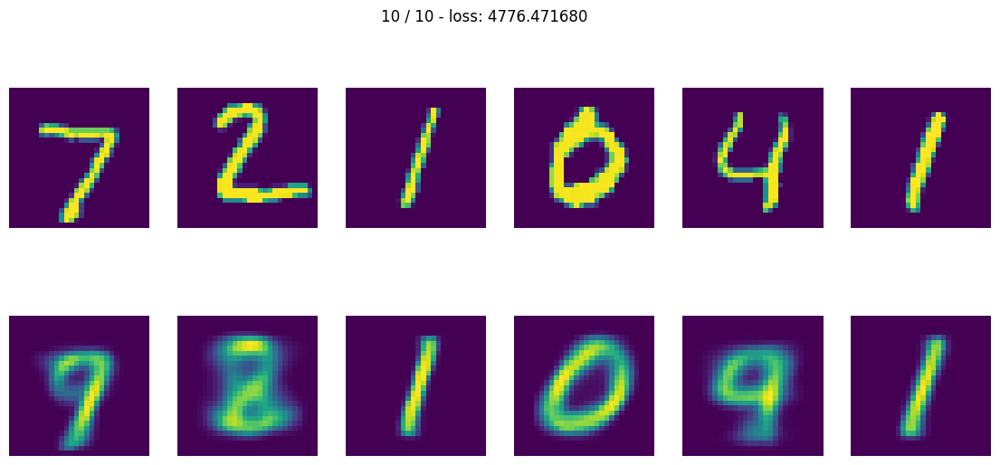

In [82]:
FIRST = True
model = VAE(784, latent_dim).to(device)

if FIRST:
    epoch_start = 0
    if not os.path.exists(net_name + "_epochs"):
        os.mkdir(net_name + "_epochs")

else:
    f = open(net_name+"_epoch.num", "rb")
    epoch_start = pickle.load(f)
    f.close()
    model.load_state_dict(torch.load(net_name + ".net"))



optimizator = optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizator, milestones=[15], gamma=0.2)


loss_fn = loss_vae

train_losses = []
test_loses = []

work_path = os.getcwd()
os.chdir(net_name+"_epochs")
analysis_data = train(model, loss_fn, epochs, epoch_start, train_loader, test_loader, scheduler)
os.chdir(work_path)
torch.save(model.state_dict(), net_name + ".net")


f = open(net_name+"_epoch.num", "wb")
epoch_next = epoch_start + epochs
pickle.dump(epoch_next, f)
f.close()


if FIRST:
    analysis_data.to_csv(net_name + ".csv")
else:
    analysis_data.to_csv(net_name+".csv", mode="a", header=False)



Давайте посмотрим, как наш тренированный VAE кодирует и восстанавливает картинки:

In [ ]:
< тут Ваш код: выведите первые Х картинок и их реконструкций из val выборки на экран>

In [14]:
# Как и в прошлый раз в блокноте показан кусок процесса обучения, а тут загружаем обученную сеть vae1.net
#os.chdir("/home/luna/Luna/Work/python/hope1/autoencode/")
model = VAE(784, latent_dim).to(device)
model.load_state_dict(torch.load("vae2.net"))

x_vl, y_vl = iter(test_loader).next()
y_vl = pd.DataFrame(y_vl.detach().numpy(), columns= ["number"])
idx = []
idx_num= []
for i in range(10):
    a = (y_vl[y_vl.number == i])
    if len(a) > 1:
        idx.append(a.index[1])
        idx_num.append(i)
print(list(zip(idx, idx_num)))

[(10, 0), (5, 1), (30, 3), (6, 4), (15, 5), (21, 6), (17, 7), (9, 9)]


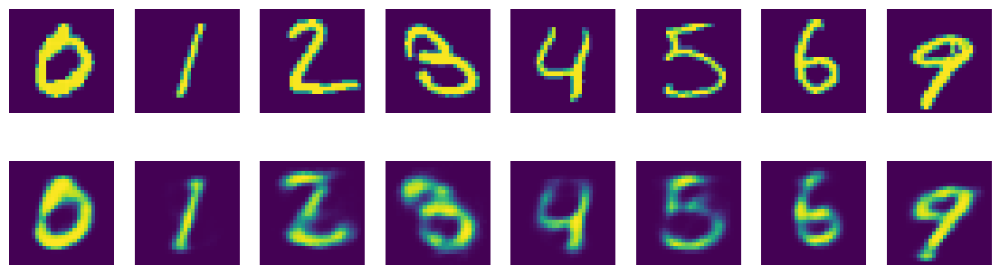

In [22]:
idx = [3,2,1,18,4,15,21,9]
x_rec_vl, _, _ =  model(torch.FloatTensor(np.array(x_vl)[idx]))

fig, ax = plt.subplots(2,len(idx), figsize =(14,4))
i = 0
for x in x_rec_vl: 
    
    ax[0][i].imshow(torch.permute(x_vl[idx[i]], (1, 2, 0)))
    ax[1][i].imshow(torch.permute(x.view(1,28,28),(1,2,0)).detach().numpy())
    
    ax[0][i].axis("off")
    ax[1][i].axis("off")
    i+=1

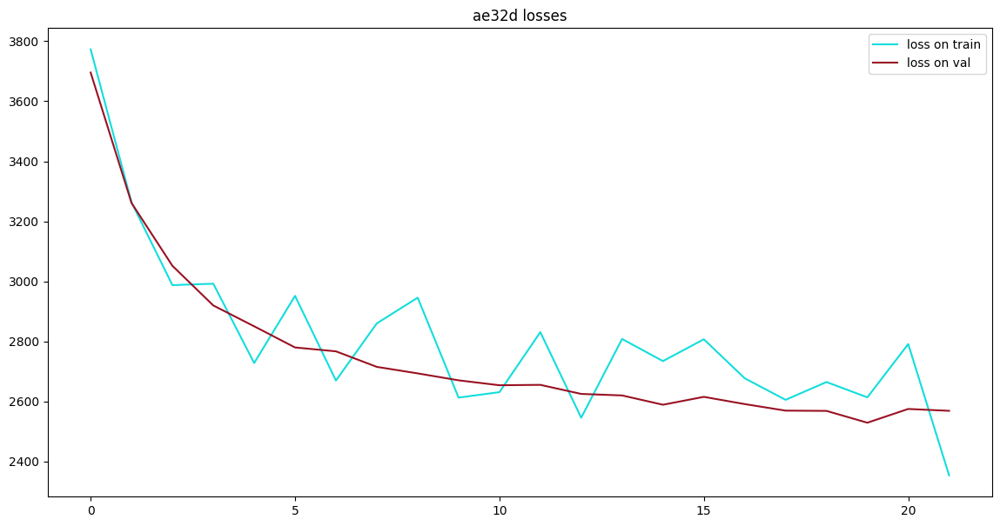

In [26]:
import pandas as pd
import matplotlib.pyplot as plt 
def plot_compare_losses(model_name, df):
    
    fig, ax = plt.subplots(1,1, figsize=(14,7))
    ax.set_title(model_name + " losses")
    ax.plot(df["loss_train"][:400], label ="loss on train", c="#12DDDD")
    
    ax.plot(df["loss_val"][:400], label = "loss on val", c="#991122")
    ax.legend()

    
    plt.show()

plot_compare_losses("ae32d", pd.read_csv("vae2.csv"))
# Вариационный автоэнкодер явно лучше обучается

Давайте попробуем проделать для VAE то же, что и с обычным автоэнкодером -- подсунуть decoder'у из VAE случайные векторы из нормального распределения и посмотреть, какие картинки получаются:

In [73]:
mus={}
logsigmas={}
for j in range(10):
    mus[j]=[]
    logsigmas[j] =[]
for x, y in train_loader:   
    for j in range(10):        
        x1 = x[y==j]
        if len(x1)>0:
            mu, logsigma = model.encode(torch.FloatTensor(x1.view(-1, 784)))    
            mus[j].append(mu.mean(axis=0).detach().numpy())
            logsigmas[j].append(logsigma.mean(axis=0).detach().numpy())

for j in range(10):
    mus[j] = np.array(mus[j])
    logsigmas[j] = np.array(logsigmas[j])

In [83]:
# Найдем мю и логсигма для цифы 1
def generate_numbers(number):
    mu = mus[number].mean(axis=0)
    # print(mu)
    logsigma = np.abs(logsigmas[number].mean(axis=0))
    # print(logsigma)
    covs = np.zeros((latent_dim, latent_dim))
    for i in range(latent_dim):    
        covs[i][i]=logsigma[i]
    z = np.random.multivariate_normal( mu, covs, latent_dim)
    output = model.decode(torch.FloatTensor(z))
    fig, ax = plt.subplots(2, 5, figsize=(14, 6))
    for i in range(5):
        for j in range(2):
        #ax[0][i].imshow(x_vl[i].detach().numpy())
        #ax[1][i].imshow(x_vl_rec[i].detach().numpy())
            
            ax[j][i].imshow(torch.permute(torch.clip(output[i+5*j],0,1).view(1,28,28),(1,2,0)).detach().numpy())
            ax[j][i].axis('off')
            
    
    fig.suptitle(f"сегенерированное число  {number}")

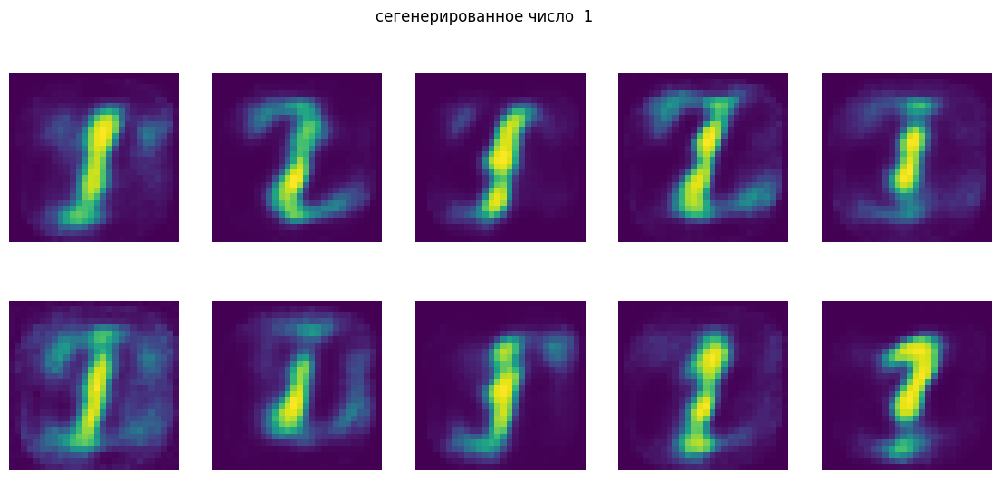

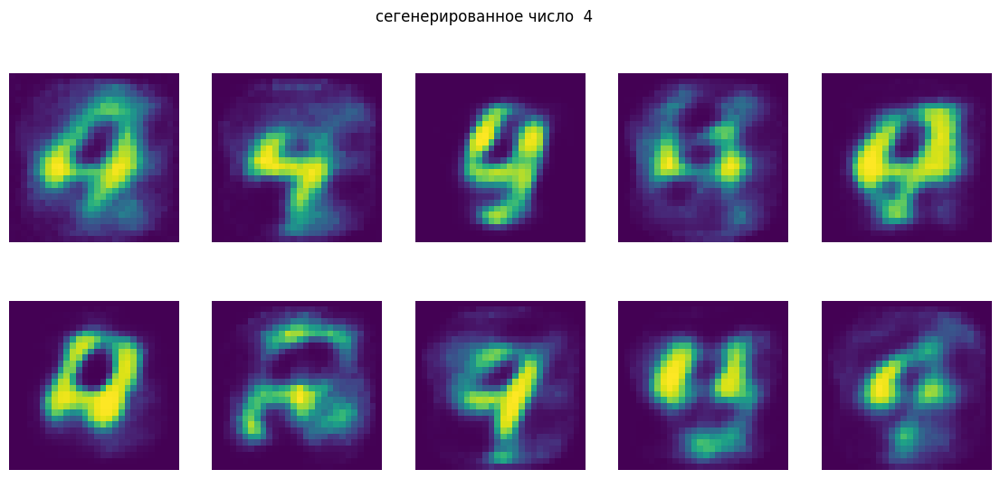

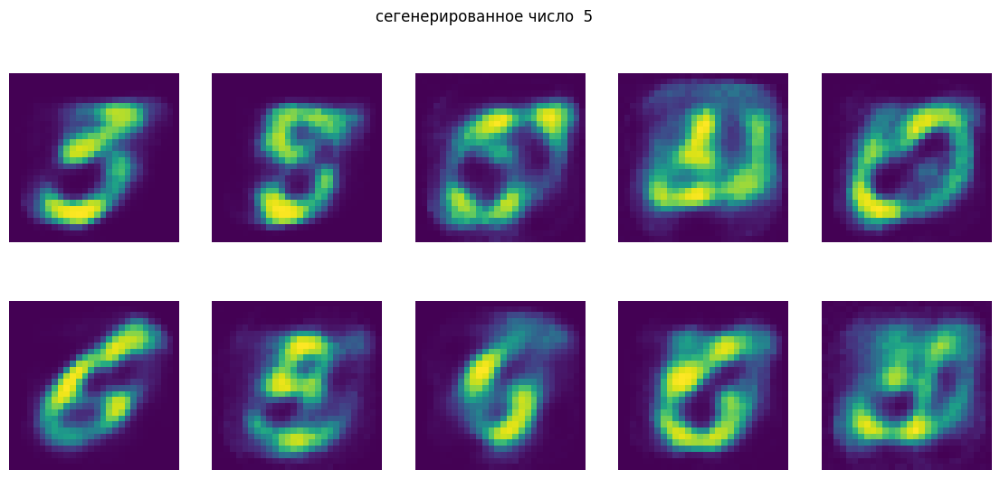

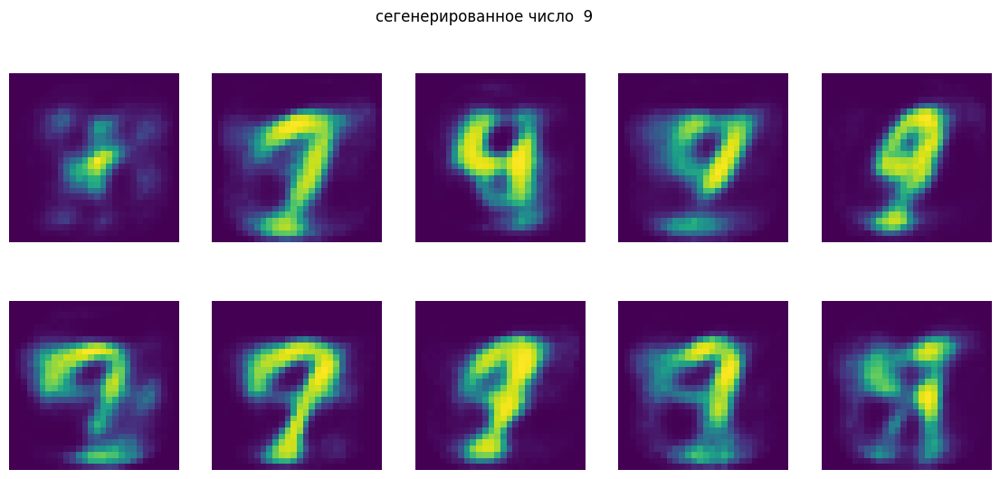

In [85]:
generate_numbers(1)
generate_numbers(4)
generate_numbers(5)
generate_numbers(9)

## 2.2. Latent Representation (2 балла)

Давайте посмотрим, как латентные векторы картинок лиц выглядят в пространстве.
Ваша задача -- изобразить латентные векторы картинок точками в двумерном просторанстве. 

Это позволит оценить, насколько плотно распределены латентные векторы изображений цифр в пространстве. 

Плюс давайте сделаем такую вещь: покрасим точки, которые соответствуют картинкам каждой цифры, в свой отдельный цвет

Подсказка: красить -- это просто =) У plt.scatter есть параметр c (color), см. в документации.


Итак, план:
1. Получить латентные представления картинок тестового датасета
2. С помощтю `TSNE` (есть в `sklearn`) сжать эти представления до размерности 2 (чтобы можно было их визуализировать точками в пространстве)
3. Визуализировать полученные двумерные представления с помощью `matplotlib.scatter`, покрасить разными цветами точки, соответствующие картинкам разных цифр.

In [105]:

for_tsne = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=10000, shuffle=False)
X, y = iter(for_tsne).next()  


In [106]:
mu, _ = model.encode(torch.FloatTensor(X.view(-1,28*28)))

In [118]:
from sklearn.manifold import TSNE
embed = TSNE()
X_embedded = embed.fit_transform(mu.detach().numpy())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f841d2f4310>
Traceback (most recent call last):
  File "/home/luna/Luna/Work/python/venv_gan/lib/python3.10/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/luna/Luna/Work/python/venv_gan/lib/python3.10/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/luna/Luna/Work/python/venv_gan/lib/python3.10/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/luna/Luna/Work/python/venv_gan/lib/python3.10/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'


(10000, 2)


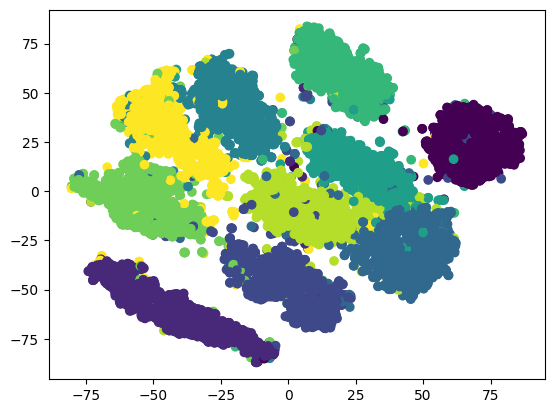

In [125]:
print(X_embedded.shape)
plt.scatter(X_embedded[:,0], X_embedded[:,1], c=y)
plt.savefig("mnist_2.png")

Что вы думаете о виде латентного представления?

В латентном пространстве видно как удачно все разделилось на 10 отдельно стоящих групп.

__Congrats v2.0!__

## 2.3. Conditional VAE (6 баллов)


Мы уже научились обучать обычный AE на датасете картинок и получать новые картинки, используя генерацию шума и декодер. 
Давайте теперь допустим, что мы обучили AE на датасете MNIST и теперь хотим генерировать новые картинки с числами с помощью декодера (как выше мы генерили рандомные лица). 
И вот нам понадобилось сгенерировать цифру 8, и мы подставляем разные варианты шума, но восьмерка никак не генерится:(

Хотелось бы добавить к нашему AE функцию "выдай мне рандомное число из вот этого вот класса", где классов десять (цифры от 0 до 9 образуют десять классов).  Conditional AE — так называется вид автоэнкодера, который предоставляет такую возможность. Ну, название "conditional" уже говорит само за себя.

И в этой части задания мы научимся такие обучать.

### Архитектура

На картинке ниже представлена архитектура простого Conditional VAE.

По сути, единственное отличие от обычного -- это то, что мы вместе с картинкой в первом слое энкодера и декодера передаем еще информацию о классе картинки. 

То есть, в первый (входной) слой энкодера подается конкатенация картинки и информации о классе (например, вектора из девяти нулей и одной единицы). В первый слой декодера подается конкатенация латентного вектора и информации о классе.


![alt text](https://sun9-63.userapi.com/impg/Mh1akf7mfpNoprrSWsPOouazSmTPMazYYF49Tw/djoHNw_9KVA.jpg?size=1175x642&quality=96&sign=e88baec5f9bb91c8443fba31dcf0a4df&type=album)

![alt text](https://sun9-73.userapi.com/impg/UDuloLNKhzTBYAKewgxke5-YPsAKyGOqA-qCRg/MnyCavJidxM.jpg?size=1229x651&quality=96&sign=f2d21bfacc1c5755b76868dc4cfef39c&type=album)



На всякий случай: это VAE, то есть, latent у него все еще состоит из mu и sigma

Таким образом, при генерации новой рандомной картинки мы должны будем передать декодеру сконкатенированные латентный вектор и класс картинки.

P.S. Также можно передавать класс картинки не только в первый слой, но и в каждый слой сети. То есть на каждом слое конкатенировать выход из предыдущего слоя и информацию о классе.

In [179]:
from torch import nn
import torch.nn.functional as F
import torch

from sklearn.preprocessing import OneHotEncoder
class CVAE(nn.Module):
    def __init__(self, input_dim, latent_dim, ohe):
        super().__init__()
        self.input_dim = input_dim
        self.fc1 = nn.Linear(input_dim+10, 500)
        self.fc21 = nn.Linear(500, latent_dim)  # fc21 for mean of Z
        self.fc22 = nn.Linear(500, latent_dim)  # fc22 for log variance of Z
        self.fc3 = nn.Linear(latent_dim+10, 500)
        self.fc4 = nn.Linear(500, input_dim)
        self.ohe = ohe

    def encode(self, x, y):
        y1 = nn.functional.one_hot(y, num_classes=10)
        x = x.view(-1, self.input_dim)
        x = torch.cat((x, y1), dim=1)

        x1 = F.relu(self.fc1(x))
        mu = self.fc21(x1)
        logsigma = self.fc22(x1)
        return mu, logsigma, y

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma)
            eps = torch.rand_like(std)
            return mu + eps * std
        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu.
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu

    def decode(self, z, y):      
        y1 = nn.functional.one_hot(y, num_classes=10)
        
        z = torch.cat((z, y1), dim=1)
        
        x = F.relu(self.fc3(z))
        return torch.sigmoid(self.fc4(x))

    def forward(self, x, y):
        # x: [batch size, 1, 28,28] -> x: [batch size, 784]

        x = x.view(-1, self.input_dim)

        mu, logsigma, y1 = self.encode(x, y)
        z = self.gaussian_sampler(mu, logsigma)
        return self.decode(z, y), mu, logsigma

In [128]:
def train(model, loss_fn, epochs, epoch_start, train_loader, test_loader, scheduler, ohe):

    analysis_dict = {"loss_train": [], "loss_val": []}
    next_epoch_num = epoch_start
    for epoch in range(epochs):
        print('* Epoch %d/%d' % (next_epoch_num + 1, epoch_start + epochs))
        for x, y in train_loader:
            loss_step = 0
            model.train()
            optimizator.zero_grad()
            x_rec, mu, logsigma = model(x.to(device), y.to(device))
            loss = loss_fn(x_rec, x, mu, logsigma)
            loss.backward()
            optimizator.step()
            if loss_step == 0:
                loss_step = loss
            else:
                loss_step = (loss_step + loss) / 2
        analysis_dict["loss_train"].append(loss_step.detach().numpy())
        print(f"on {epoch + epoch_start + 1} / {epochs + epoch_start} loss: {loss}")
        x_vl, y_vl = iter(test_loader).next()
        x_vl_rec, x_vl_mu, x_vl_logsigma = model(x_vl, y_vl)
        loss_val = loss_fn(x_vl_rec, x_vl, x_vl_mu, x_vl_logsigma)
        analysis_dict["loss_val"].append(loss_val.detach().numpy())

        fig, ax = plt.subplots(2, 6, figsize=(14, 6))
        for i in range(6):
            ax[0][i].imshow(torch.permute(x_vl[i],(1,2,0)).detach().numpy())
            ax[1][i].imshow(torch.permute(x_vl_rec[i].view(1,28,28),(1,2,0)).detach().numpy())
            ax[0][i].axis('off')
            ax[1][i].axis("off")

        fig.suptitle('%d / %d - loss: %f' % (next_epoch_num + 1, epoch_start + epochs, loss_val))
        fig.savefig(str(next_epoch_num + 1) + ".jpg")
        next_epoch_num += 1
        scheduler.step()

    return pd.DataFrame(analysis_dict)

* Epoch 1/15
on 1 / 15 loss: 4188.33642578125
* Epoch 2/15
on 2 / 15 loss: 3549.96044921875
* Epoch 3/15
on 3 / 15 loss: 2924.26220703125
* Epoch 4/15
on 4 / 15 loss: 3046.17626953125
* Epoch 5/15
on 5 / 15 loss: 2930.2353515625
* Epoch 6/15
on 6 / 15 loss: 2927.6630859375
* Epoch 7/15
on 7 / 15 loss: 2596.893310546875
* Epoch 8/15
on 8 / 15 loss: 2798.841552734375
* Epoch 9/15
on 9 / 15 loss: 3014.3935546875
* Epoch 10/15
on 10 / 15 loss: 3056.614501953125
* Epoch 11/15
on 11 / 15 loss: 2679.156494140625
* Epoch 12/15
on 12 / 15 loss: 2626.688232421875
* Epoch 13/15
on 13 / 15 loss: 2501.197265625
* Epoch 14/15
on 14 / 15 loss: 2755.3271484375
* Epoch 15/15
on 15 / 15 loss: 2585.58544921875


NameError: name 'pickle' is not defined

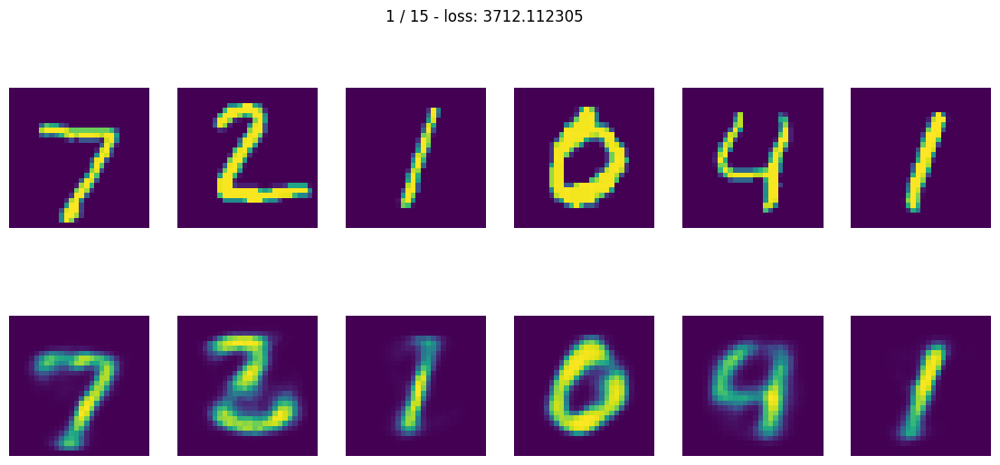

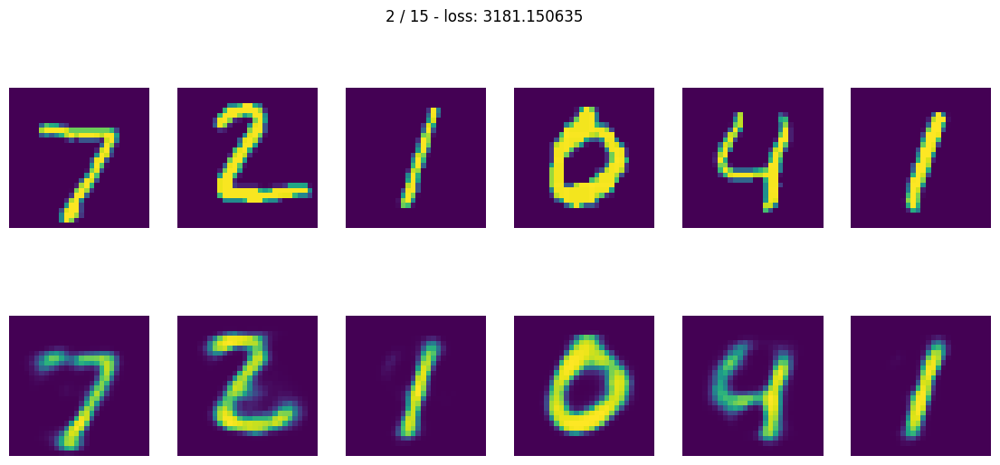

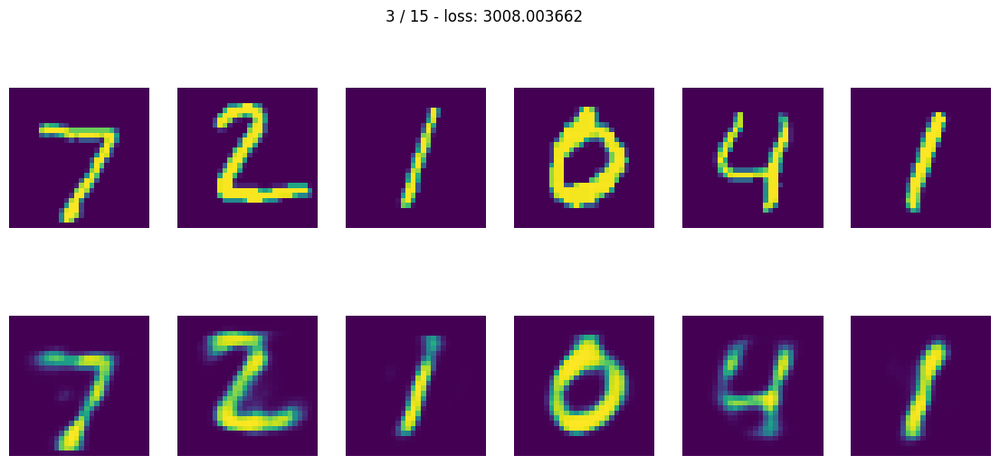

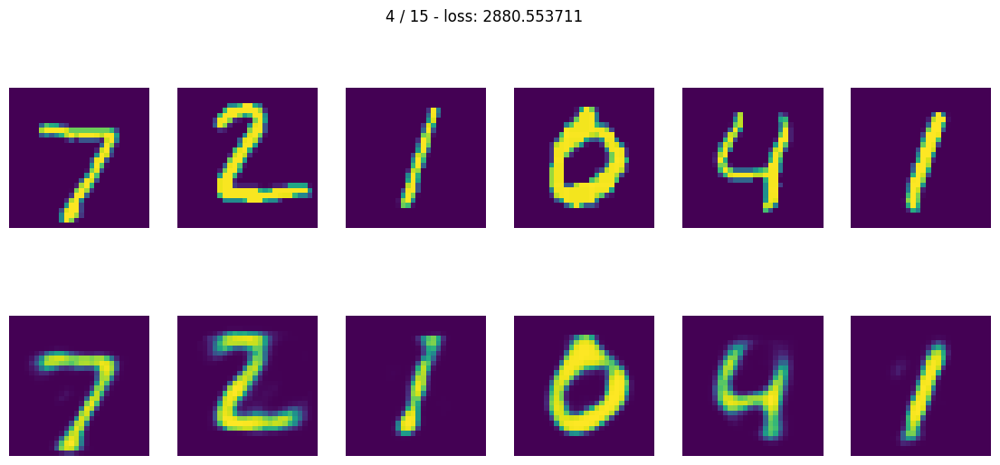

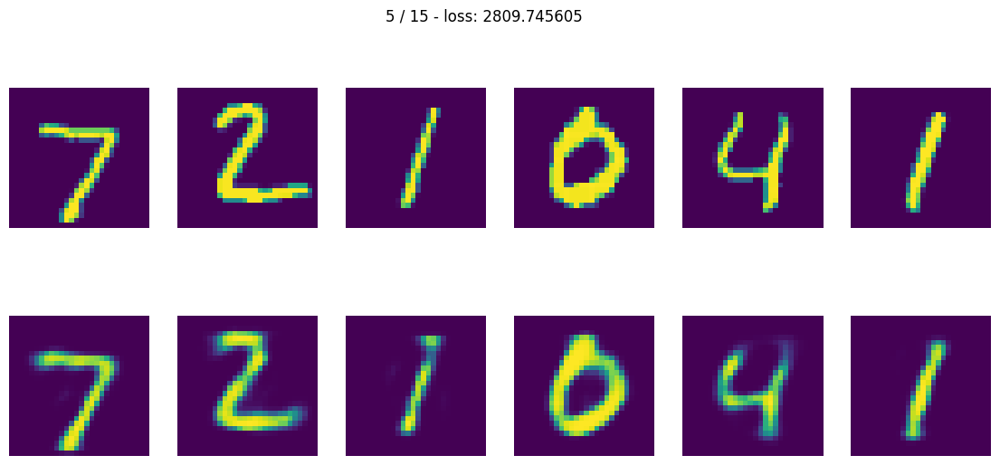

...

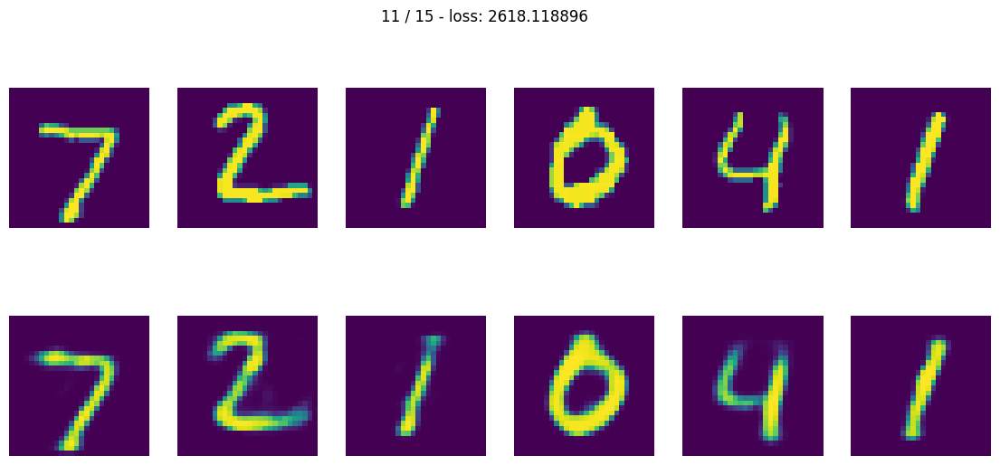

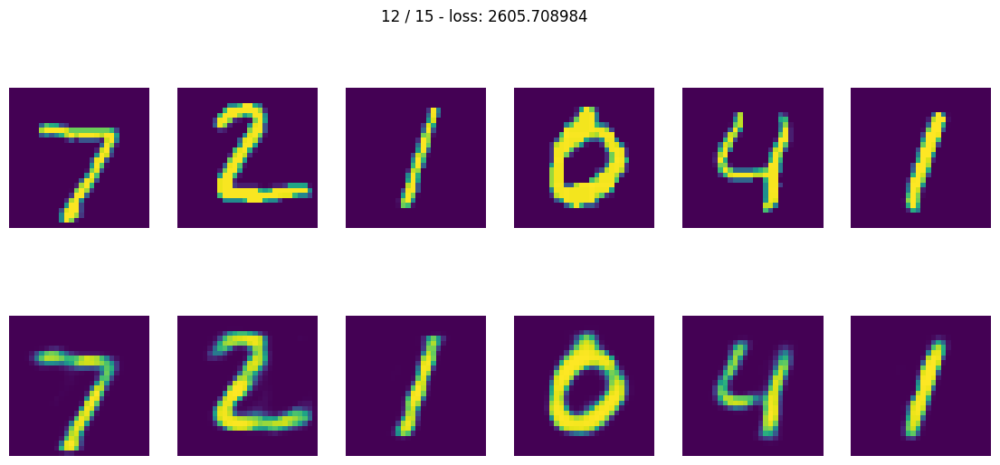

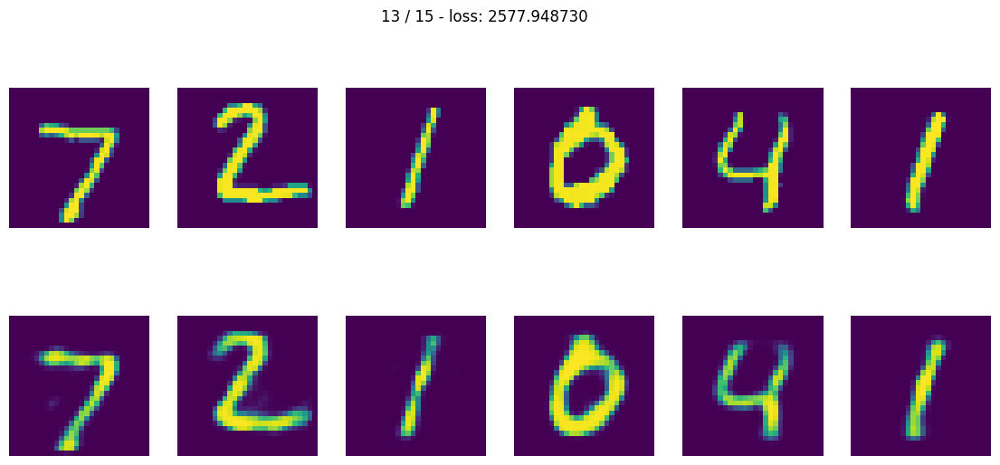

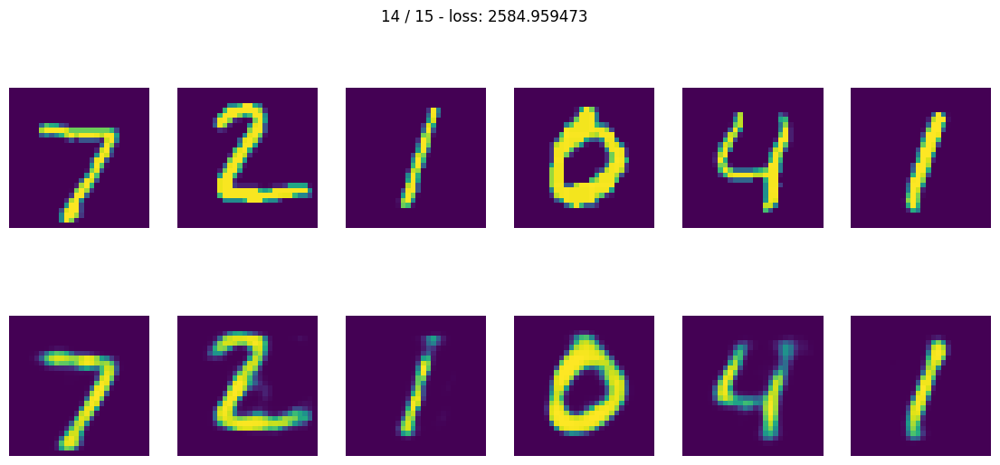

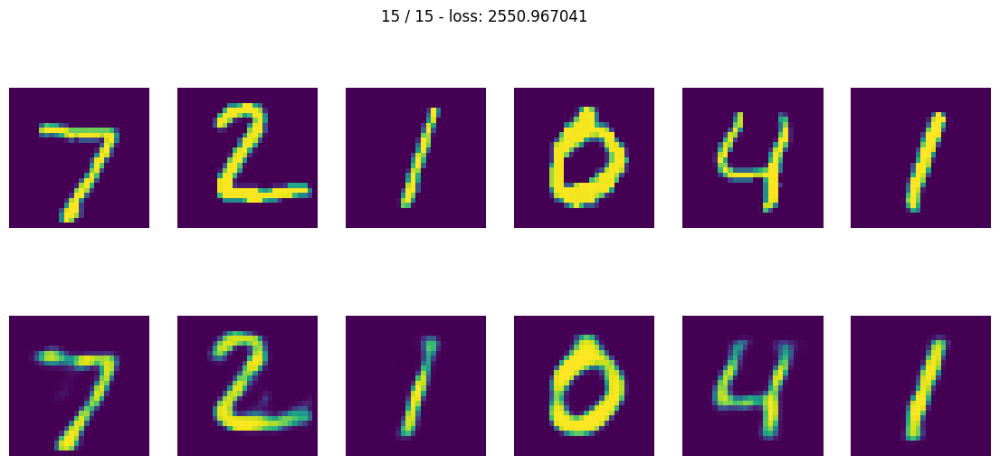

In [129]:
import pickle
FIRST = True
net_name ="cvae1"

epochs = 15
latent_dim = 32
lr = 1e-4
ohe = OneHotEncoder(max_categories=10, sparse_output=False).fit(torch.LongTensor(np.array(range(10)).reshape(10, 1)))

model = CVAE(784, latent_dim, ohe).to(device)

if FIRST:
    epoch_start = 0
    if not os.path.exists(net_name + "_epochs"):
        os.mkdir(net_name + "_epochs")

else:
    f = open(net_name+"_epoch.num", "rb")
    epoch_start = pickle.load(f)
    f.close()
    model.load_state_dict(torch.load(net_name + ".net"))



optimizator = optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizator, milestones=[15], gamma=0.2)


loss_fn = loss_vae

train_losses = []
test_loses = []

work_path = os.getcwd()
os.chdir(net_name+"_epochs")
analysis_data = train(model, loss_fn, epochs, epoch_start, train_loader, test_loader, scheduler, ohe)
os.chdir(work_path)
torch.save(model.state_dict(), net_name + ".net")


f = open(net_name+"_epoch.num", "wb")
epoch_next = epoch_start + epochs
pickle.dump(epoch_next, f)
f.close()


if FIRST:
    analysis_data.to_csv(net_name + ".csv")
else:
    analysis_data.to_csv(net_name+".csv", mode="a", header=False)


### Sampling


Тут мы будем сэмплировать из CVAE. Это прикольнее, чем сэмплировать из простого AE/VAE: тут можно взять один и тот же латентный вектор и попросить CVAE восстановить из него картинки разных классов!
Для MNIST вы можете попросить CVAE восстановить из одного латентного вектора, например, картинки цифры 5 и 7.

In [ ]:
<тут нужно научиться сэмплировать из декодера цифры определенного класса>

In [180]:
model = CVAE(784, latent_dim, ohe).to(device)
model.load_state_dict(torch.load("cvae1.net"))

<All keys matched successfully>

In [181]:
# Найдем мю и логсигма для цифы 1
def generate_numbers(number):
    mu = mus[number].mean(axis=0)
    # print(mu)
    logsigma = np.abs(logsigmas[number].mean(axis=0))
    # print(logsigma)
    covs = np.zeros((latent_dim, latent_dim))
    for i in range(latent_dim):    
        covs[i][i]=logsigma[i]
    z = np.random.multivariate_normal( mu, covs, latent_dim)
    #z= np.random.randn(0,1,latent_dim)
    numbers = np.ones((latent_dim))*number   
   
    output = model.decode(torch.FloatTensor(z), torch.LongTensor(numbers))
    fig, ax = plt.subplots(2, 5, figsize=(14, 6))
    for i in range(5):
        for j in range(2):
        #ax[0][i].imshow(x_vl[i].detach().numpy())
        #ax[1][i].imshow(x_vl_rec[i].detach().numpy())
            
            ax[j][i].imshow(torch.permute(torch.clip(output[i+5*j],0,1).view(1,28,28),(1,2,0)).detach().numpy())
            ax[j][i].axis('off')
            
    
    fig.suptitle(f"сегенерированное число  {number}")
    fig.savefig("tmp1.jpg")


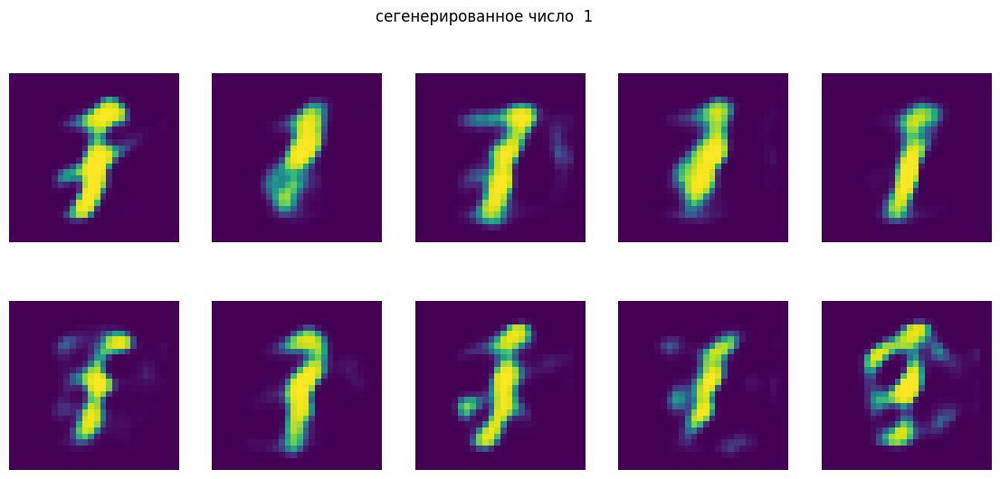

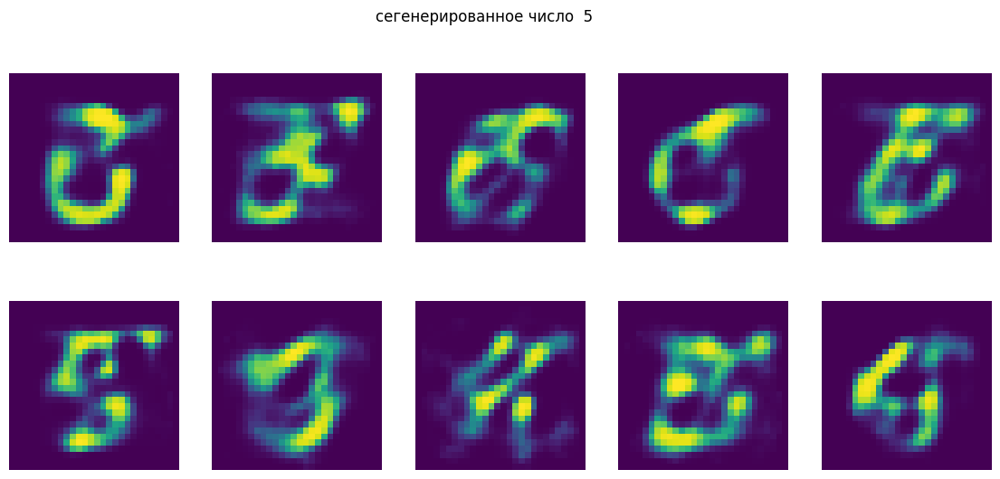

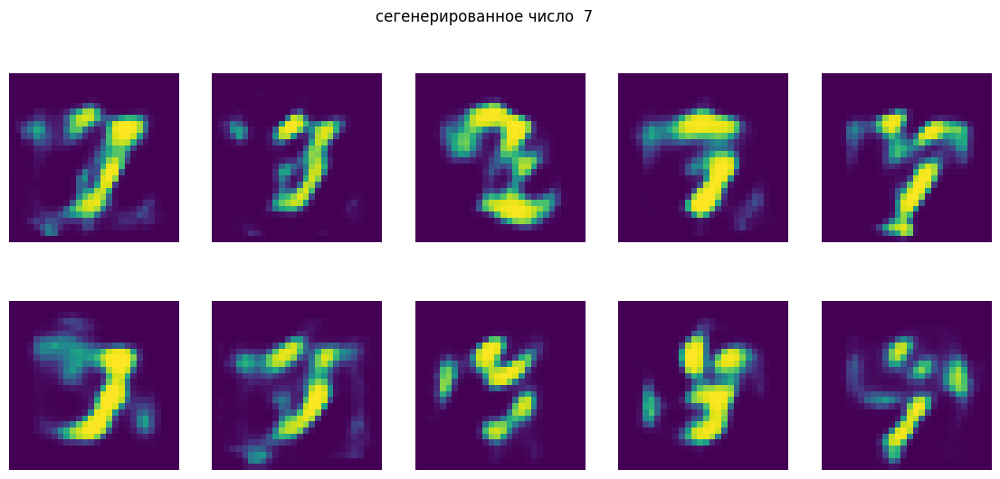

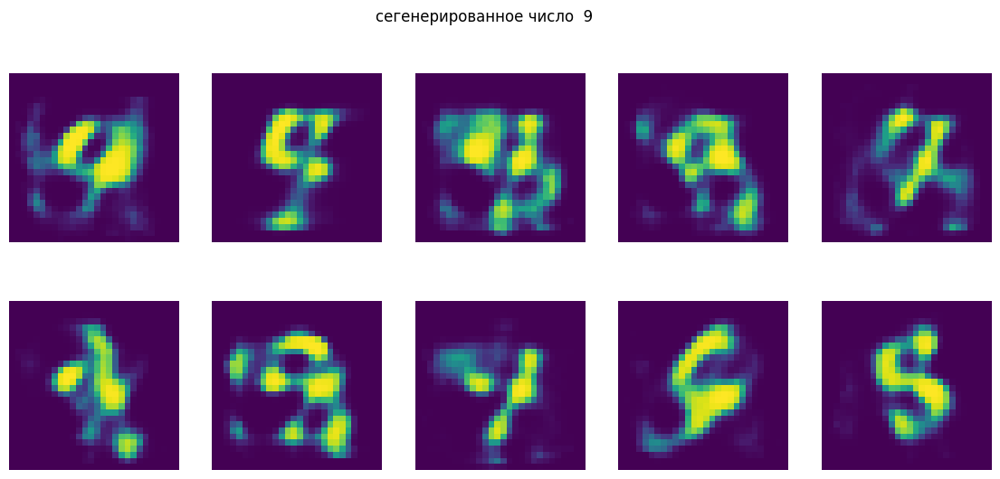

In [183]:
generate_numbers(1)
generate_numbers(5)
generate_numbers(7)
generate_numbers(9)

Почему то получилсь числа хуже, чем в обычном вариационном энкодере

Splendid! Вы великолепны!


### Latent Representations

Давайте посмотрим, как выглядит латентное пространство картинок в CVAE и сравним с картинкой для VAE =)

Опять же, нужно покрасить точки в разные цвета в зависимости от класса.

In [ ]:
<ваш код получения латентных представлений, применения TSNE и визуализации>

Что вы думаете насчет этой картинки? Отличается от картинки для VAE?

# Почему то обычный вариационный автоэнкодер разбил данные на компактыне группы, а условный почему то некоторые классы сделал разрывными. 

In [185]:

for_tsne = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=10000, shuffle=False)
X, y = iter(for_tsne).next()  

In [193]:
mu, _, cl = model.encode(torch.FloatTensor(X.view(-1,28*28)),y)

In [194]:
y1 = nn.functional.one_hot(y, num_classes=10)
mu_and_cl = torch.cat((mu,y1), dim=1)

In [195]:
from sklearn.manifold import TSNE
embed = TSNE()
X_embedded = embed.fit_transform(mu_and_cl.detach().numpy())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f8409eaec20>
Traceback (most recent call last):
  File "/home/luna/Luna/Work/python/venv_gan/lib/python3.10/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/luna/Luna/Work/python/venv_gan/lib/python3.10/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/luna/Luna/Work/python/venv_gan/lib/python3.10/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/luna/Luna/Work/python/venv_gan/lib/python3.10/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'


(10000, 2)


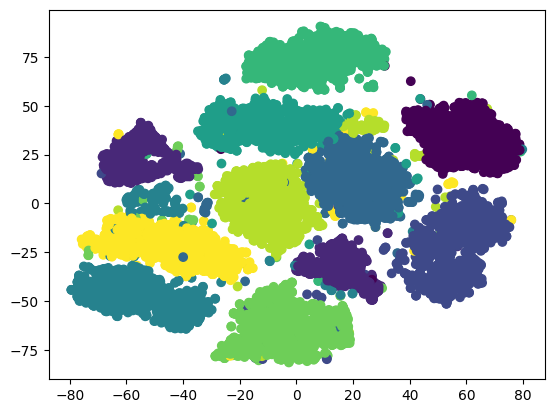

In [197]:
print(X_embedded.shape)
plt.scatter(X_embedded[:,0], X_embedded[:,1], c=y)
plt.savefig("mnist_22.png")

# BONUS 1: Denoising

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

У автоэнкодеров, кроме сжатия и генерации изображений, есть другие практические применения. Про одно из них эта бонусная часть задания.

Автоэнкодеры могут быть использованы для избавления от шума на фотографиях (denoising). Для этого их нужно обучить специальным образом: input картинка будет зашумленной, а выдавать автоэнкодер должен будет картинку без шума. 
То есть, loss-функция AE останется той же (MSE между реальной картинкой и выданной), а на вход автоэнкодеру будет подаваться зашумленная картинка.

<a href="https://ibb.co/YbRJ1nZ"><img src="https://i.ibb.co/0QD164t/Screen-Shot-2020-06-04-at-4-49-50-PM.png" alt="Screen-Shot-2020-06-04-at-4-49-50-PM" border="0"></a>

Для этого нужно взять ваш любимый датасет (датасет лиц из первой части этого задания или любой другой) и сделать копию этого датасета с шумом. 

В питоне шум можно добавить так:

In [ ]:
noise_factor = 0.5
X_noisy = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape) 

In [ ]:
<тут ваш код обучения автоэнкодера на зашумленных картинках. Не забудтье разбить на train/test!>

In [ ]:
<тут проверка, как AE убирает щум с тестовых картинок. Надеюсь, все получилось =)>

# BONUS 2: Image Retrieval

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

Давайте представим, что весь наш тренировочный датасет -- это большая база данных людей. И вот мы получили картинку лица какого-то человека с уличной камеры наблюдения (у нас это картинка из тестового датасета) и хотим понять, что это за человек. Что нам делать? Правильно -- берем наш VAE, кодируем картинку в латентное представление и ищем среди латентныз представлений лиц нашей базы самые ближайшие!

План:

1. Получаем латентные представления всех лиц тренировочного датасета
2. Обучаем на них LSHForest `(sklearn.neighbors.LSHForest)`, например, с `n_estimators=50`
3. Берем картинку из тестового датасета, с помощью VAE получаем ее латентный вектор
4. Ищем с помощью обученного LSHForest ближайшие из латентных представлений тренировочной базы
5. Находим лица тренировочного датасета, которым соответствуют ближайшие латентные представления, визуализируем!

Немного кода вам в помощь: (feel free to delete everything and write your own)

In [ ]:
codes = <поучите латентные представления картинок из трейна>

In [ ]:
# обучаем LSHForest
from sklearn.neighbors import LSHForest
lshf = LSHForest(n_estimators=50).fit(codes)

In [ ]:
def get_similar(image, n_neighbors=5):
  # функция, которая берет тестовый image и с помощью метода kneighbours у LSHForest ищет ближайшие векторы
  # прогоняет векторы через декодер и получает картинки ближайших людей

  code = <получение латентного представления image>
    
  (distances,),(idx,) = lshf.kneighbors(code, n_neighbors=n_neighbors)

  return distances, X_train[idx]

In [ ]:
def show_similar(image):

  # функция, которая принимает тестовый image, ищет ближайшие к нему и визуализирует результат
    
    distances,neighbors = get_similar(image,n_neighbors=11)
    
    plt.figure(figsize=[8,6])
    plt.subplot(3,4,1)
    plt.imshow(image.cpu().numpy().transpose([1,2,0]))
    plt.title("Original image")
    
    for i in range(11):
        plt.subplot(3,4,i+2)
        plt.imshow(neighbors[i].cpu().numpy().transpose([1,2,0]))
        plt.title("Dist=%.3f"%distances[i])
    plt.show()

In [ ]:
<тут выведите самые похожие лица к какому-нибудь лицу из тестовой части датасета>